## Outline 

1. Does the model for $P(v_r, v_t|r, M)$ fit particles?
- calibrate model on particle data. 
    - need to update selection to match R, vlos cuts.
    - fit radial component
    - fit tan component
    - fit joint model simultaneously 

2. Recover Mass from fake DESI data
- fit P(vlos|R, M) using calibrated gal model, by rescaling histograms by conversion factor of V_DESI / V_SIM * n_DESI / n_SIM and fitting for M ONLY
- fit again but using the model calibrated on particle data. 


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import h5py as h5
import sys
sys.path.append('/home/cosweeney/code/Fits/')

import matplotlib
matplotlib.rcParams.update({'text.usetex': True, 
                            'font.family': 'Computer Modern Roman'})

with h5.File('/spiff/cosweeney/Tables/halo_pair_cat_final2_HD.hdf5', 'r') as pc:
    print(pc.keys(), end=' ')

    tag = np.array(pc['tag'])
    orbit_mask = (tag == 0)
    infall_mask = (tag == 1) 

    hostmvir = np.array(pc['hostmvir'])
    hostrvir = np.array(pc['hostrvir'])

    #Massbins
    print('Minimum M:', hostmvir.min()/1e14, '$10^{14}M_\odot$')
    print('Maximum M:', hostmvir.max()/1e14, '$10^{14}M_\odot$')

    mini=hostmvir.min()
    maxi=1.6e15#pc['hostmvir'].max()

    #Choose Bins: Log-spaced bins between min and max
    massbins = np.logspace( np.log10(mini), np.log10(maxi), 7+1)
    mbins = np.delete(massbins, -2)
    print('massbins:', mbins)

    Rvirs=[]
    Mvirs=[]
    for i in range(len(mbins)-1):
        mmask = (hostmvir>=mbins[i])&(hostmvir<=mbins[i+1])
        orbi_M = hostmvir[mmask&orbit_mask]
        orbi_R = hostrvir[mmask&orbit_mask]
        print(mbins[i]/1e14, mbins[i+1]/1e14)

        Rvirs.append(np.median(orbi_R))
        Mvirs.append(np.median(orbi_M))
    Rvirs=np.array(Rvirs)
    Mvirs=np.array(Mvirs)

# radial bins
r_edges = np.linspace(4, 30, 26+1)
r_cens = (r_edges[1:]+r_edges[:-1])/2.0

<>:22: SyntaxWarning: invalid escape sequence '\o'
<>:23: SyntaxWarning: invalid escape sequence '\o'
<>:22: SyntaxWarning: invalid escape sequence '\o'
<>:23: SyntaxWarning: invalid escape sequence '\o'
/tmp/ipykernel_359349/4289947500.py:22: SyntaxWarning: invalid escape sequence '\o'
  print('Minimum M:', hostmvir.min()/1e14, '$10^{14}M_\odot$')
/tmp/ipykernel_359349/4289947500.py:23: SyntaxWarning: invalid escape sequence '\o'
  print('Maximum M:', hostmvir.max()/1e14, '$10^{14}M_\odot$')


<KeysViewHDF5 ['FAS', 'R', 'hostFAS', 'hostM200b', 'hostM200c', 'hostdesid', 'hostid', 'hostmvir', 'hostpid', 'hostrvir', 'hostupid', 'hostvmax', 'hostvrms', 'hostvx', 'hostvy', 'hostvz', 'hostx', 'hosty', 'hostz', 'id', 'r', 'sb_id', 'tag', 'upid', 'v_circ', 'v_r', 'v_tot', 'vlos', 'vx', 'vy', 'vz', 'vz_pec', 'x', 'y', 'z']> Minimum M: 0.80002004 $10^{14}M_\odot$
Maximum M: 22.285 $10^{14}M_\odot$
massbins: [8.00020227e+13 1.22732852e+14 1.88287152e+14 2.88855436e+14
 4.43139440e+14 6.79829904e+14 1.60000000e+15]
0.8000202269281375 1.2273285213892782
1.2273285213892782 1.882871518385872
1.882871518385872 2.888554362556256
2.888554362556256 4.431394401565781
4.431394401565781 6.798299037325463
6.798299037325463 16.000000000000007


In [2]:
#Define Functions (credit to E.M. Salazar, see https://github.com/edgarmsalazar/dynhalo/blob/main/dynhalo/finder/coordinates.py)
from dynhalo.finder.coordinates import relative_coordinates
from dynhalo.finder.subbox import get_sub_box_id, generate_sub_box_ids, generate_sub_box_grid, get_adjacent_sub_box_ids, split_simulation_into_sub_boxes, load_particles
from dynhalo.finder.catalogue import find_r200_m200
from dynhalo.utils import G_gravity, timer
from typing import Tuple
from tqdm.notebook import tqdm

import numba

def get_zw13_vpeclos_vphyslos(
    pos: np.ndarray,
    vel: np.ndarray,
) -> Tuple[np.ndarray]:
    """Computes the radial and tangential velocites from cartesian/rectangular 
    coordinates following the definitions of Zu & Weinberg 2013.
    https://academic.oup.com/mnras/article/431/4/3319/1147861

    Parameters
    ----------
    pos : np.ndarray
        Cartesian coordinates
    vel : np.ndarray
        Cartesian velocities

    Returns
    -------
    Tuple[np.ndarray]
        Radial velocity and tangential velocity. 
    """
    #Compute projected and 3D radial separation
    rp = np.sqrt(np.sum(np.square(pos[:, :2]), axis=1))
    r3d = np.sqrt(np.square(rp)+np.square(pos[:, 2]))
    
    #Compute angle between projected and 3D radial separation 
    # theta = arctan( z / rp )
    theta = np.arctan2(pos[:, 2], rp) 

    #Compute radial velocity using cartesian coordinates
    vpeclos = np.sum(pos * vel, axis=1) / r3d 
    vphyslos = ( vel[:, 2] - vpeclos * np.sin(theta) ) / np.cos(theta)

    return vpeclos, vphyslos


def _load_sub_box(
    sub_box_id: int,
    path: str,
    name: str = None,
) -> Tuple[np.ndarray]:
    """Load sub-box

    Parameters
    ----------
    sub_box_id : int
        Sub-box ID
    path : str
        Location from where to load the file
    name : str, optional
        Identifier within the file, by default None

    Returns
    -------
    Tuple[np.ndarray]
        Position, velocity, ID and row index
    """
    if name:
        prefix = f'{name}/'
    else:
        prefix = None
    try:
        with h5.File(path + f'sub_boxes/{sub_box_id}.hdf5', 'r') as hdf:
            pos = hdf[prefix + 'pos'][()]
            vel = hdf[prefix + 'vel'][()]
            pid = hdf[prefix + 'ID'][()]
            row = hdf[prefix + 'row_idx'][()]
    except:
        pos, vel, pid, row = None, None, None, None
    return pos, vel, pid, row


def load_particles(
    sub_box_id: int,
    boxsize: float,
    subsize: float,
    path: str,
    padding: float = 5.0,
) -> Tuple[np.ndarray]:
    """Load particles from a sub-box

    Parameters
    ----------
    sub_box_id : int
        Sub-box ID
    path : str
        Location from where to load the file
    boxsize : float
        Size of simulation box
    subsize : float
        Size of sub-box
    padding : float
        Only particles up to this distance from the sub-box edge are considered 
        for classification. Defaults to 5

    Returns
    -------
    Tuple[np.ndarray]
        Position, velocity, ID and row index
    """
    # Generate the IDs and positions of the sub-box grid
    grid_ids, grid_pos = generate_sub_box_grid(boxsize, subsize)
    # Get the adjacent sub-box IDs
    adj_sub_box_ids = get_adjacent_sub_box_ids(
        sub_box_id=sub_box_id,
        sub_box_ids=grid_ids,
        positions=grid_pos,
        boxsize=boxsize,
        subsize=subsize
    )

    # Create empty lists (containers) to save the data from file for each ID
    pos, vel, pid, row = ([[] for _ in range(len(adj_sub_box_ids))]
                          for _ in range(4))

    # Load all adjacent boxes
    for i, sub_box in enumerate(adj_sub_box_ids):
        pos[i], vel[i], pid[i], row[i] = _load_sub_box(
            sub_box, path, name='part')
    # Concatenate into a single array
    pos = np.concatenate(pos)
    vel = np.concatenate(vel)
    pid = np.concatenate(pid)
    row = np.concatenate(row)

    # Mask particles within a padding distance of the edge of the box in each
    # direction
    loc_id = grid_ids == sub_box_id
    padded_distance = subsize #0.5 * subsize + padding
    rel_abs_position = np.abs(relative_coordinates(
        grid_pos[loc_id], pos, boxsize, periodic=True))
    # Probably a better way to create this mask
    mask_x = (rel_abs_position[:, 0] < padded_distance)
    mask_y = (rel_abs_position[:, 1] < padded_distance)
    mask_z = (rel_abs_position[:, 2] < padded_distance)
    mask = mask_x & mask_y & mask_z

    return pos[mask], vel[mask], pid[mask], row[mask]

@timer
def _select_parts_around_haloes(
    n_seeds: int,
    r_max: float,
    boxsize: float,
    subsize: float,
    file_seeds: str,
    path: str,
    mass_mask: np.ndarray,
) -> Tuple[np.ndarray]:
    """Locates for the largest `v_max` seeds and searches for all the partaxies
    around them up to a distance `r_max`.

    Parameters
    ----------
    n_seeds : int
        Number of seeds to process
    r_max : float
        Maximum distance to consider
    boxsize : float
        Size of simulation box
    subsize : float
        Size of sub-box
    file_seeds : str
        File containing the seeds, including path.
    path : str
        Path to the sub-boxes
    mass_mask : np.ndarray
        Array used for masking halos by halo mass (M_vir/M_200m)

    Returns
    -------
    Tuple[np.ndarray]
        Radial distance, radial velocity, and log of the square of the velocity
    """
    # Load seed data
    with h5.File(file_seeds, 'r') as hdf:
        vmax = hdf['vmax'][()][mass_mask]
        order = np.argsort(vmax)[::-1]

        hid = hdf['Orig_halo_ID'][()][mass_mask]
        pos_seed = np.vstack(
            [
                hdf['x'][()][mass_mask],
                hdf['y'][()][mass_mask],
                hdf['z'][()][mass_mask],
            ]
        ).T
        vel_seed = np.vstack(
            [
                hdf['vx'][()][mass_mask],
                hdf['vy'][()][mass_mask],
                hdf['vz'][()][mass_mask],
            ]
        ).T

        hrvir = hdf['rvir'][()][mass_mask]
    vmax = vmax[order][:]
    hid = hid[order][:]
    pos_seed = pos_seed[order][:]
    vel_seed = vel_seed[order][:]
    rvir_seed = hrvir[order][:]

    # Locate sub-box IDs for all seeds.
    seed_sub_box_id = get_sub_box_id(pos_seed%boxsize, boxsize, subsize)
    # Sort by sub-box ID
    order = np.argsort(seed_sub_box_id)
    seed_sub_box_id = seed_sub_box_id[order]
    vmax = vmax[order]
    hid = hid[order]
    pos_seed = pos_seed[order]
    vel_seed = vel_seed[order]
    rvir_seed = rvir_seed[order]

    # Get unique sub-box ids
    unique_sub_box_ids = np.unique(seed_sub_box_id)

    # Create empty lists (containers) to save the data from file for each ID
    r, R, rlos, vpeclos, vphyslos, vr, vt = ([] for _ in range(7))
    # Iterate over sub-box IDs
    # NOTE: Could parallelise this but it is not super slow
    for sub_box_id in tqdm(unique_sub_box_ids, desc='Processing sub-box',
                        colour='blue', ncols=100, leave=False):
        pos, vel, _, _ = load_particles(sub_box_id, boxsize, subsize, path)

        # Iterate over seeds in current sub-box ID
        mask_seeds_in_sub_box = seed_sub_box_id == sub_box_id
        for i in tqdm(range(mask_seeds_in_sub_box.sum()), desc='Iterating over seeds',
                         colour='green', ncols=100, leave=False):
        #for i in range(mask_seeds_in_sub_box.sum()):
            # Compute the relative positions of all particles in the box
            rel_pos = relative_coordinates(pos_seed[mask_seeds_in_sub_box][i]%boxsize, pos%boxsize,
                                           boxsize) 
            z_sep = pos[:, 2]%boxsize - pos_seed[mask_seeds_in_sub_box][i][2]%boxsize 
            
            # Only work with those close to the seed
            sb_max = 80
            mask_x = np.abs(rel_pos[:, 0]) <= sb_max
            mask_y = np.abs(rel_pos[:, 1]) <= sb_max
            mask_z = np.abs(rel_pos[:, 2]) <= sb_max
            mask_close = mask_x * mask_y * mask_z

            # pos_i = pos[mask_close]
            rel_pos = rel_pos[mask_close]
            rel_vel = vel[mask_close] - vel_seed[mask_seeds_in_sub_box][i]
            z_sep = z_sep[mask_close]

            # Compute radial and tangential velocity
            a = 0.83760
            H = 74.71913613009617
            h = 0.6777 # damn you, little h!
            
            vpeclosp = rel_vel[:, 2] #get_zw13_vr_vt(rel_pos, rel_vel)
            vphyslosp = vpeclosp + a * H * z_sep / h 

            # select particless within R, v_los cut
            R_max = r_max # h^-1 Mpc
            vlosmax = 4_000 #km/s

            # Compute the radial separations, vr & vt
            rp = np.sqrt(np.sum(np.square(rel_pos), axis=1))
            Rp = np.sqrt(np.sum(np.square(rel_pos[:, :2]), axis=1))
            rlosp = rel_pos[:, 2]

            theta = np.arctan2(rlosp, Rp) 

            #Compute radial velocity using cartesian coordinates
            vrp = np.sum(rel_pos * rel_vel, axis=1) / rp  
            vtp = ( vpeclosp - vrp * np.sin(theta) ) / np.cos(theta)            

            Rmask = Rp <= R_max
            vlosmask = np.abs(vphyslosp) <= vlosmax 

            cutmask = Rmask * vlosmask 

            # Append to containers
            r.append(rp[cutmask])
            R.append(Rp[cutmask])
            rlos.append(rlosp[cutmask])
            vpeclos.append(vpeclosp[cutmask])
            vphyslos.append(vphyslosp[cutmask])
            vr.append(vrp[cutmask])
            vt.append(vtp[cutmask])
            
    # Concatenate into a single array
    r = np.concatenate(r)
    R = np.concatenate(R)
    rlos = np.concatenate(rlos)
    vpeclos = np.concatenate(vpeclos)
    vphyslos = np.concatenate(vphyslos)
    vr = np.concatenate(vr)
    vt = np.concatenate(vt)

    return r, R, rlos, vpeclos, vphyslos, vr, vt 

### Update particle selection; include vr, vt data

In [ ]:
# compute relative velocities, separations for particles in bins of mass  

part_path = "/spiff/cosweeney/simulations/MDPL2/ds_particles/UM_particle_table_ds1000.h5"
hsb_path = '/spiff/cosweeney/simulations/MDPL2/hlists/SBp/'
psb_path = '/spiff/cosweeney/simulations/MDPL2/ds_particles/SB/'
vel_path = '/spiff/cosweeney/simulations/MDPL2/data/particle_rel_v_R_mass_cyl.hdf5'

box_length = 1000 #Mpc/h, MDPL2 box side length
    
for k in tqdm(reversed(range(len(Mvirs)))):
    print(k)
    halo_path = '/spiff/cosweeney/simulations/MDPL2/hlists/hlist_0.83760_update.hdf5'

    with h5.File(halo_path, 'r') as hcat:

        mcut = (hcat['mvir'] > mbins[k]) & (hcat['mvir'] <= mbins[k+1])

        hid = hcat['id'][()][mcut]

        rel_r, rel_R, rel_rlos, rel_vpec, rel_vphys, rel_vr, rel_vt = _select_parts_around_haloes( len(hid), 31.0, box_length, box_length / 10, halo_path, psb_path, mass_mask=mcut)  

        with h5.File(vel_path, 'a') as hdf:
            hdf.create_dataset(name=f'r/{str(k)}', data=rel_r, dtype=np.float64)
            hdf.create_dataset(name=f'R/{str(k)}', data=rel_R, dtype=np.float64)
            hdf.create_dataset(name=f'rlos/{str(k)}', data=rel_rlos, dtype=np.float64)
            hdf.create_dataset(name=f'vpeclos/{str(k)}', data=rel_vpec, dtype=np.float64)
            hdf.create_dataset(name=f'vphyslos/{str(k)}', data=rel_vphys, dtype=np.float64)
            hdf.create_dataset(name=f'vr/{str(k)}', data=rel_vr, dtype=np.float64)
            hdf.create_dataset(name=f'vt/{str(k)}', data=rel_vt, dtype=np.float64)            

### Calibrate Model: initialize parameters.
- Fit JSU to radial histograms. What is the relationship between parameters? That is, what are the parameters of the relations $\gamma(\xi)$ and $\delta(\lambda)$?
- compute $v_{r,\rm peak}(r)$, $\sigma_r^2(r)$. Fit with plaw and plaw+const: note constant for sigma. 
- compute conditional distributions, fit t-distribution with dof=5 to each, and plot scale parameter as fcn of vr|r. Note coordinates of minima, shape. 

- Fit mass dependent relations to relevant parameters. 

With this initialization, run MLE and then MCMC.

In [3]:
# bin velocities, compute joint histograms
vel_path = '/spiff/cosweeney/simulations/MDPL2/data/particle_rel_v_R_mass_cyl.hdf5'

bin_num = 50

vr_p = []
vt_p = []

JH_p = np.zeros((bin_num, bin_num, len(Mvirs), len(r_cens)))

for k in range(len(Mvirs)):
    for i in range(len(r_cens)):
        with h5.File(vel_path, 'r') as f:
            r = f[f'r/{str(k)}'][()]
            vr = f[f'vr/{str(k)}'][()]
            vt = f[f'vt/{str(k)}'][()]
        mask = (r >= r_edges[i])&(r <= r_edges[i+1])
        
        vr_p.append(vr[mask])
        vt_p.append(vt[mask])

        hist, vedges, _ = np.histogram2d(vr[mask], vt[mask], bins=bin_num, range=[[-2500, 2500], [-2500, 2500]], density=False)
        JH_p[:, :, k, i] = hist 

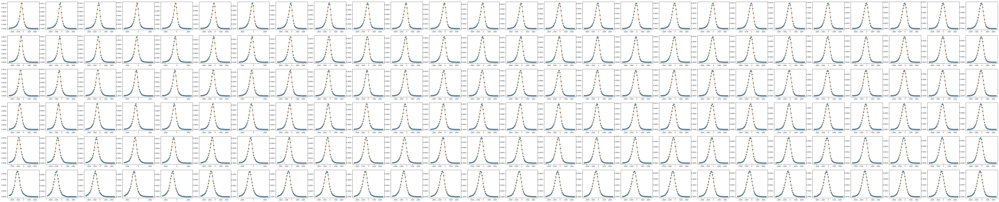

In [4]:
# Fit JSU to distributions. Check Histograms
from scipy.stats import johnsonsu, t
from scipy.optimize import curve_fit

jsu_pars_p = np.zeros((4, len(Mvirs), len(r_cens)))
jsu_errs_p = np.zeros((4, 4, len(Mvirs), len(r_cens)))
r_peaks = np.zeros((len(Mvirs), len(r_cens)))
rcounts = np.zeros((bin_num, len(Mvirs), len(r_cens)))

dv = np.diff(vedges)[0]
vcens = 0.5*(vedges[1:]+vedges[:-1])
v_range = np.linspace(vedges[0], vedges[-1], 1000)

fig, ax = plt.subplots(len(Mvirs), len(r_cens), figsize=(100, 20))

for k in range(len(Mvirs)):
    for i in range(len(r_cens)):

        JD_p = JH_p[:, :, k, i] / np.sum(JH_p[:, :, k, i]) / dv**2 
        r_dist = np.sum(JD_p, axis=1)*dv
        rcounts[:, k, i] = np.sum(JH_p[:, :, k, i], axis=1)

        p, c = curve_fit(lambda x, gam, delt, xi, lam: johnsonsu.pdf(x, gam, delt, loc=xi, scale=lam), vcens, r_dist, p0=[0.0, 1.0, -100, 400])

        jsu_pars_p[:, k, i] = p
        jsu_errs_p[:, :, k, i] = c 

        ax[k, i].scatter(vcens, r_dist, c="C0")
        ax[k, i].plot(v_range, johnsonsu.pdf(v_range, p[0], p[1], loc=p[2], scale=p[3]), c="C1")

        r_peaks[k, i] = v_range[np.argmax(johnsonsu.pdf(v_range, p[0], p[1], loc=p[2], scale=p[3]))]

Text(0.5, 0.98, 'Particle Radial Dists: JSU pars $f(r|M)$')

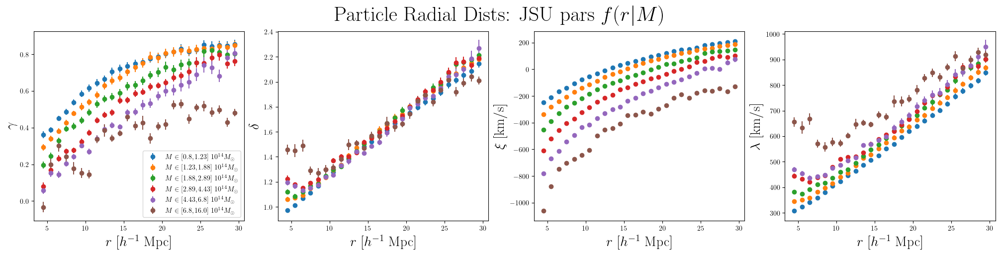

In [5]:
fig, ax = plt.subplots(1, len(jsu_pars_p), figsize=(20, 5), layout='constrained')

rpar_labels = [r'$\gamma$', r'$\delta$', r'$\xi \ [\mathrm{km/s}]$', r'$\lambda \ [\mathrm{km/s}]$']

for j in range(len(jsu_pars_p)):
    for k in range(len(Mvirs)): 
        ax[j].errorbar(r_cens, jsu_pars_p[j, k, :], np.sqrt(jsu_errs_p[j, j, k, :]), fmt='o', label=f'$M\in[{round(mbins[k]/1e14, 2)}, {round(mbins[k+1]/1e14, 2)}] \ 10^{{14}}M_\odot$')
        ax[j].set_xlabel(r'$r \ [h^{-1}$ Mpc]', fontsize=20)
        ax[j].set_ylabel(rpar_labels[j], fontsize=20)
ax[0].legend(fontsize=10)

fig.suptitle(r'Particle Radial Dists: JSU pars $f(r|M)$', fontsize=30)

Mean Pars:  0.00095 0.66
Mean Pars:  0.00215 0.27


Text(0.5, 0.98, 'Particle Radial Dists: JSU pars Interdependence')

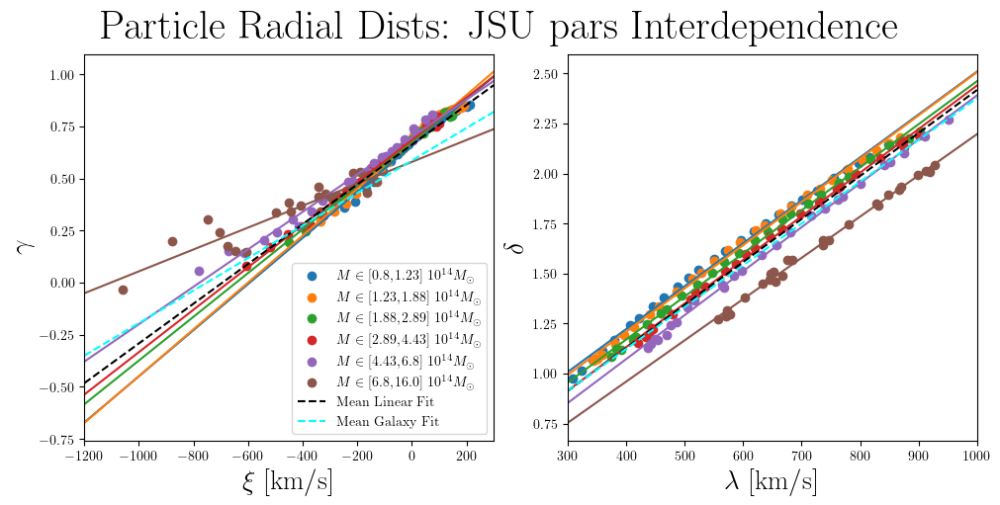

In [6]:
fig, ax = plt.subplots(1, len(jsu_pars_p)//2, figsize=(10, 5), layout='constrained')

rpar_labels = [r'$\gamma$', r'$\delta$', r'$\xi \ [\mathrm{km/s}]$', r'$\lambda \ [\mathrm{km/s}]$']

jsu_idpars = np.zeros((2, 2, len(Mvirs)))

xs = [np.linspace(-1200, 300), np.linspace(300, 1000)]

gal_mean = [[7.8e-4, 0.5859], [2.09e-3, 0.2870]]

for j in range(len(jsu_pars_p)//2):
    for k in range(len(Mvirs)): 
        x = jsu_pars_p[j+2, k, :] 
        y = jsu_pars_p[j, k, :]

        p, c = curve_fit(lambda x, m, b: m*x+b, x, y)
        jsu_idpars[:, j, k] = p

        ax[j].scatter(x, y, label=f'$M\in[{round(mbins[k]/1e14, 2)}, {round(mbins[k+1]/1e14, 2)}] \ 10^{{14}}M_\odot$')
        ax[j].plot(xs[j], p[0]*xs[j]+p[1])
        ax[j].set_ylabel(rpar_labels[j], fontsize=20)
        ax[j].set_xlabel(rpar_labels[j+2], fontsize=20)
    ax[j].plot(xs[j], np.mean(jsu_idpars[0, j, :])*xs[j]+np.mean(jsu_idpars[1, j, :]), c='k', ls='--', label="Mean Linear Fit")
    ax[j].plot(xs[j], gal_mean[j][0]*xs[j]+gal_mean[j][1], label="Mean Galaxy Fit", c='cyan', ls='--')
    print("Mean Pars: ", round(np.mean(jsu_idpars[0, j, :]), 5), round(np.mean(jsu_idpars[1, j, :]), 2))
    ax[j].margins(x=0)
ax[0].legend(fontsize=10)
fig.suptitle(r'Particle Radial Dists: JSU pars Interdependence', fontsize=30) 

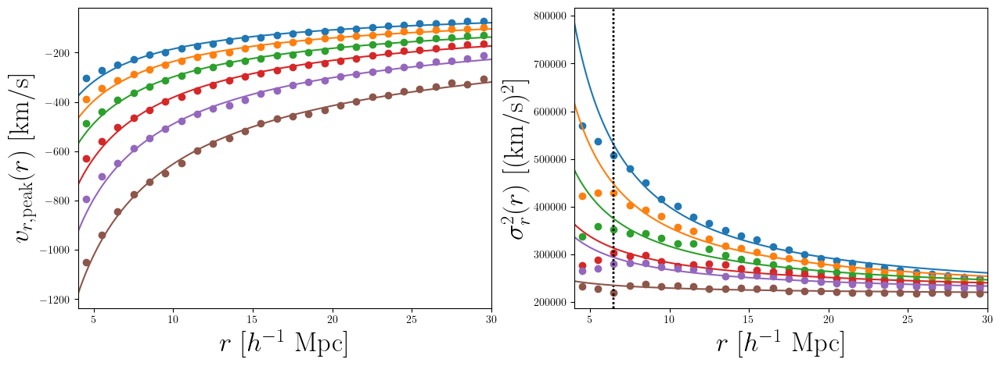

In [7]:
input_par_labels = [r"$v_{r,\rm peak}(r)$ [km/s]", r"$\sigma_r^2(r)$ [(km/s)$^2$]"]

var_r  = 0.5*jsu_pars_p[3]**2*( np.exp(1/jsu_pars_p[1]**2) - 1 ) * ( np.exp(1/jsu_pars_p[1]**2) * np.cosh(2*jsu_pars_p[0]/jsu_pars_p[1]) + 1 )
var_r2 = 0.5*jsu_pars_p[3]**2*( np.exp(1/(0.00215*jsu_pars_p[3]+0.27)**2) - 1 ) * ( np.exp(1/(0.00215*jsu_pars_p[3]+0.27)**2) * np.cosh(2*(0.00095*jsu_pars_p[2]+0.66)/(0.00215*jsu_pars_p[3]+0.27)) + 1 )

inputs = [r_peaks, var_r2]

rs = np.linspace(r_edges[0], r_edges[-1], 1000)

vrp_pars = np.zeros((2, len(Mvirs)))
vrp_covs = np.zeros((2, 2, len(Mvirs)))

vrv_pars = np.zeros((2, len(Mvirs)))
vrv_covs = np.zeros((2, 2, len(Mvirs)))

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

for i in range(2):
    for k in range(len(Mvirs)):
        ax[i].scatter(r_cens, inputs[i][k], marker='o')
        ax[i].set_xlabel(r'$r \ [h^{-1}\ \mathrm{Mpc}]$', fontsize=25)
        ax[i].set_ylabel(input_par_labels[i], fontsize=25)
        ax[1].axvline(r_cens[2], c='k', ls=':')
        ax[i].margins(x=0)

        if i == 0:
            p, c = curve_fit(lambda x, p, s: p*(x/10)**s, r_cens[2:], inputs[i][k][2:])
            ax[i].plot(rs, p[0]*(rs/10)**p[1])
            vrp_pars[:, k] = p 
            vrp_covs[:, :, k] = c 
        else:
            p, c = curve_fit(lambda x, p, s: p*(x/10)**s + 213000, r_cens[2:], inputs[i][k][2:], maxfev=10_000)
            ax[i].plot(rs, p[0]*(rs/10)**p[1]+ 213000)
            vrv_pars[:, k] = p 
            vrv_covs[:, :, k] = c 


In [8]:
# save data for later 

path = '/spiff/cosweeney/simulations/MDPL2/data/parameters/rad_jsu_mass_raw_particles.npy'

np.save(path, jsu_pars_p)  

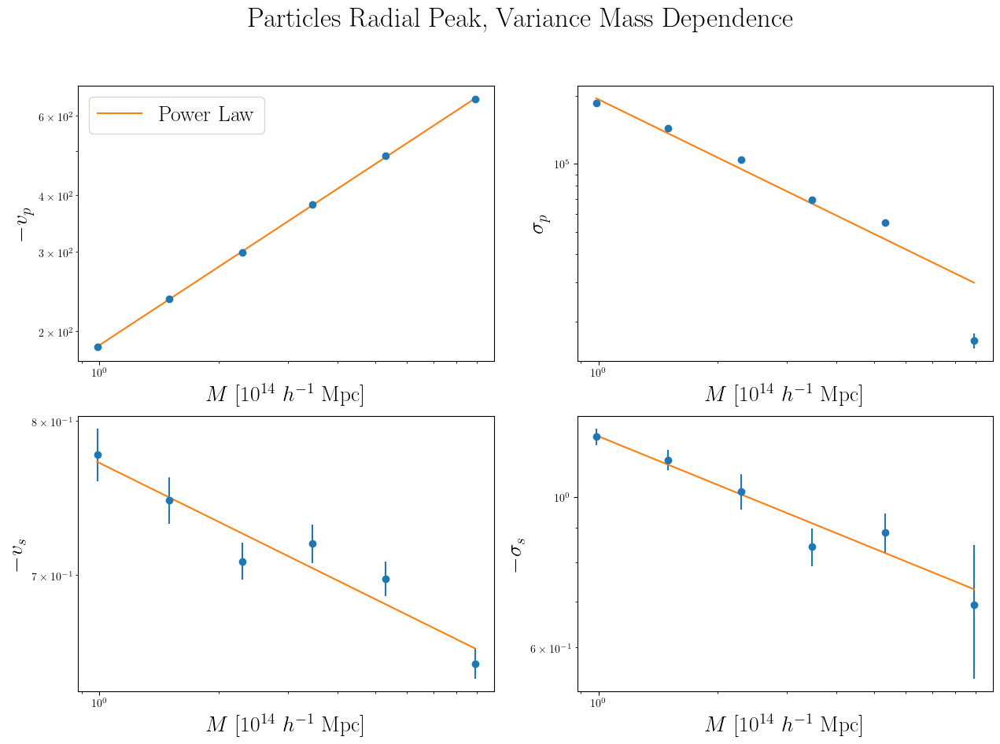

In [16]:
# mass dependence

fig, ax = plt.subplots(2, 2, figsize=(15, 10))

fig.suptitle(r"Particles Radial Peak, Variance Mass Dependence", fontsize=25)

ms = np.linspace(Mvirs[0]/1e14, Mvirs[-1]/1e14, 1000)

def power_law(x, p, s):
    return p * x ** s

rad_md_pars = [] #np.zeros(10)

ax[0, 0].errorbar(Mvirs/1e14, -vrp_pars[0], np.sqrt(vrp_covs[0, 0]), fmt='o')
p, c = curve_fit(power_law, xdata=Mvirs/1e14, ydata=-vrp_pars[0], sigma=np.sqrt(vrp_covs[0, 0]), maxfev=10_000)
rad_md_pars.append(p)
ax[0, 0].plot(ms, power_law(ms, *p), label=r'Power Law')
ax[0, 0].set_xlabel(r"$M\ [10^{14} \ h^{-1} \ \mathrm{Mpc}]$", fontsize=20)
ax[0, 0].set_ylabel(r"$-v_{p}$", fontsize=20)
ax[0, 0].set_xscale('log')
ax[0, 0].set_yscale('log')
ax[0, 0].legend(fontsize=20)

ax[1, 0].errorbar(Mvirs/1e14, -vrp_pars[1], np.sqrt(vrp_covs[1, 1]), fmt='o')
p, c = curve_fit(power_law, xdata=Mvirs/1e14, ydata=-vrp_pars[1], sigma=np.sqrt(vrp_covs[1, 1]), maxfev=10_000)
rad_md_pars.append(p)
ax[1, 0].plot(ms, power_law(ms, *p))
ax[1, 0].set_xlabel(r"$M\ [10^{14} \ h^{-1} \ \mathrm{Mpc}]$", fontsize=20)
ax[1, 0].set_ylabel(r"$-v_{s}$", fontsize=20)
ax[1, 0].set_xscale('log')
ax[1, 0].set_yscale('log')

ax[0, 1].errorbar(Mvirs/1e14, vrv_pars[0], np.sqrt(vrv_covs[0, 0]), fmt='o')
p, c = curve_fit(power_law, xdata=Mvirs/1e14, ydata=vrv_pars[0], sigma=np.sqrt(vrv_covs[0, 0]), maxfev=10_000)
rad_md_pars.append(p)
ax[0, 1].plot(ms, power_law(ms, *p))
ax[0, 1].set_xlabel(r"$M\ [10^{14} \ h^{-1} \ \mathrm{Mpc}]$", fontsize=20)
ax[0, 1].set_ylabel(r"$\sigma_{p}$", fontsize=20)
ax[0, 1].set_xscale('log')
ax[0, 1].set_yscale('log')

ax[1, 1].errorbar(Mvirs/1e14, -vrv_pars[1], np.sqrt(vrv_covs[1, 1]), fmt='o')
p, c = curve_fit(power_law, xdata=Mvirs/1e14, ydata=-vrv_pars[1], sigma=np.sqrt(vrv_covs[1, 1]), maxfev=10_000)
rad_md_pars.append(p)
ax[1, 1].plot(ms, power_law(ms, *p))
ax[1, 1].set_xlabel(r"$M\ [10^{14} \ h^{-1} \ \mathrm{Mpc}]$", fontsize=20)
ax[1, 1].set_ylabel(r"$-\sigma_{s}$", fontsize=20)
ax[1, 1].set_xscale('log')
ax[1, 1].set_yscale('log') 

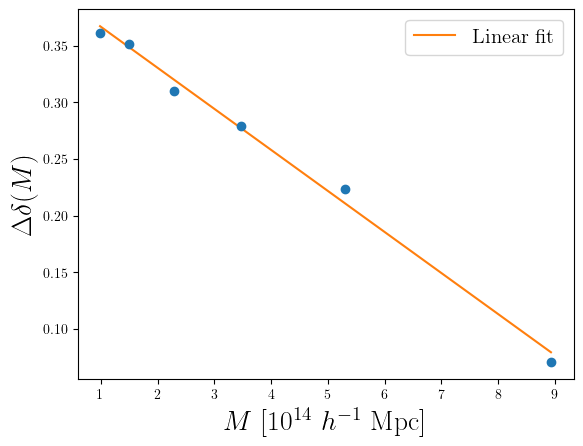

In [17]:
deltas = np.zeros(len(Mvirs))
d_covs = np.zeros(len(Mvirs))

for k in range(len(Mvirs)):
    x = jsu_pars_p[1+2, k, :] 
    y = jsu_pars_p[1, k, :]

    p, c = curve_fit(lambda x, d: 0.00215*x+d, x, y) 

    deltas[k] = p 
    d_covs[k] = c 

p, c = curve_fit(lambda x, m, b: m*x+b, xdata=Mvirs/1e14, ydata=deltas, sigma=np.sqrt(d_covs))
rad_md_pars.append(p) 
plt.errorbar(Mvirs/1e14, deltas, d_covs, fmt='o')
plt.plot(ms, p[0]*ms+p[1], label="Linear fit")
plt.xlabel(r"$M\ [10^{14} \ h^{-1} \ \mathrm{Mpc}]$", fontsize=20)
plt.ylabel(r"$\Delta \delta (M)$", fontsize=20)
plt.legend(fontsize=15)

In [5]:
# check initialization 
import pickle

#path = "/spiff/cosweeney/simulations/MDPL2/data/models/"
path = "/spiff/cosweeney/simulations/MDPL2/data/models/"

with open(path+'RBFint_xi_particles.pkl', 'rb') as f:
    xi_RBF = pickle.load(f)

with open(path+'RBFint_lam_particles.pkl', 'rb') as f: 
    lam_RBF = pickle.load(f) 

def line(x, m, b):
    return m*x+b

def marginal_radial_dist(vr, r, M, pars):
    """The smooth model for the marginal radial 
    distribution P(v_r|r, M). 

    This is a Johnson's SU distribution 
    (https://en.wikipedia.org/wiki/Johnson%27s_SU-distribution)
    which is reparameterized to take the 
    distribution peak and variance as 
    input, using an RBF interpolator. 

    Args:
        vr (np.ndarray): radial velocity bin centers. 
        r (float): radial distance bin center.
        M (float): Mass bin median.
    """

    vrpp, vrps, vrsp, vrss, srpp, srps, srsp, srss, delta_m, delta_b = pars

    # Mass dependence
    M_pivot = 1e14 # M_sun
    vr_p = -power_law( M / M_pivot, vrpp, vrps)
    vr_s = -power_law( M / M_pivot, vrsp, vrss)

    sr_p = power_law( M / M_pivot, srpp, srps)
    sr_s = -power_law( M / M_pivot, srsp, srss)

    r_pivot = 10 # radial pivot, 10 h^-1 Mpc

    sr_0 = 213000 # variance limit as r -> 00, km^2 s^-2

    # Radial dependence
    peak = power_law(r / r_pivot , vr_p, vr_s)
    variance = power_law(r / r_pivot, sr_p, sr_s) + sr_0  

    xi = xi_RBF(np.column_stack([peak, variance]))[0] # interpolators
    lam = lam_RBF(np.column_stack([peak, variance]))[0]

    # gam = 0.00078 * xi + 0.58599 # JSU skew, kurtosis 
    # delt = 0.00209 * lam + 0.28703 + line(M / M_pivot, delta_m, delta_b)
    
    gam = 0.00095 * xi + 0.66 # JSU skew, kurtosis 
    delt = 0.00215 * lam + 0.27 + line(M / M_pivot, delta_m, delta_b)

    dist = johnsonsu.pdf(vr, a=gam, b=delt, loc=xi, scale=lam)

    return dist 

def radial_distribution_vec(vr, r, M, pars):
    vpp, vps, vsp, vss, spp, sps, ssp, sss, ddm, ddb = pars

    m = M[:, None]/1e14

    vp = -power_law(m, vpp, vps)
    vs = -power_law(m, vsp, vss)
    sp = power_law(m, spp, sps)
    ss = -power_law(m, ssp, sss)

    dd = line(m, ddm, ddb)

    vpeak = power_law(r[None, :]/10, vp, vs)
    vvar  = power_law(r[None, :]/10, sp, ss)+ 213000

    parstack = np.stack((vpeak, vvar), axis=-1).reshape(-1, 2)
    

    xi = xi_RBF(parstack).reshape(len(M), len(r))
    lam = lam_RBF(parstack).reshape(len(M), len(r))

    gam = 0.00095 * xi + 0.66 # JSU skew, kurtosis 
    delt = 0.00215 * lam + 0.27 + dd #line(m, ddm, ddb)

    dist = johnsonsu.pdf(vr[:, None, None], a=gam, b=delt, loc=xi, scale=lam)

    return dist 


In [18]:
rad_md_pars = np.array(rad_md_pars).flatten()
rad_md_pars

array([ 1.86588047e+02,  5.72629729e-01,  7.71125092e-01, -7.31128836e-02,
        1.93293387e+05, -8.54059322e-01,  1.23073452e+00, -2.38195143e-01,
       -3.62746512e-02,  4.03148635e-01])

In [14]:
rad_md_pars = np.array([ 1.86588047e+02,  5.72629729e-01,  7.71125092e-01, -7.31128836e-02,
        1.93293387e+05, -8.54059322e-01,  1.23073452e+00, -2.38195143e-01,
       -3.62746512e-02,  4.03148635e-01])

In [223]:
fig, ax = plt.subplots(len(Mvirs), len(r_cens), figsize=(150, 50))
model_ini = radial_distribution_vec(v_range, r_cens, Mvirs, rad_md_pars)
model_MLE = radial_distribution_vec(v_range, r_cens, Mvirs, soln.x)
model_BF =  radial_distribution_vec(v_range, r_cens, Mvirs, BFs)

for k in range(len(Mvirs)):
    for i in range(len(r_cens)):

        JD_p = JH_p[:, :, k, i] / np.sum(JH_p[:, :, k, i]) / dv**2 
        r_dist = np.sum(JD_p, axis=1)*dv

        ax[k, i].scatter(vcens, r_dist, c=f"C{str(k)}")
        #ax[k, i].plot(v_range, marginal_radial_dist(v_range, r_cens[i], Mvirs[k], rad_md_pars), c="C1")
        #ax[k, i].plot(v_range, model_ini[:, k, i], f'C{str(k)}')
        ax[k, i].plot(v_range, model_BF[:, k, i], f'C{str(k)}')
        ax[k, i].set_xlabel(r'$v_r$', fontsize=30)
        ax[k, i].set_yticks([])
        ax[k, 0].set_ylabel(f"$M={round(Mvirs[k]/1e14, 2)} \ 10^{{14}} \ h^{{-1}} \ M_\odot$", fontsize=30)

fig.suptitle(r"Smooth Radial Model Fit to Particles", fontsize=70) 

Text(0.5, 0.98, 'Smooth Radial Model Fit to Particles')

In [215]:
# fit with a chain
import scipy

def poisson_llh(pars):
    N = np.sum(rcounts[:, :, 2:], axis=0)[np.newaxis, :, :] #Num of gals in radial bin
    P = radial_distribution_vec(vcens, r_cens[2:], Mvirs, pars)
    n = rcounts[:, :, 2:] # Num of gals in vel bin

    lam = P*dv*N 
    log_likelihood = np.sum(scipy.stats.poisson.logpmf(k=n, mu=lam)) 
    
    return log_likelihood 

def poisson_llh_sub(pars):
    N = np.sum(rcounts[:, :, :], axis=0)[np.newaxis, :, :] #Num of gals in radial bin
    #dv = dv #5000 / 50
    totpars = np.concatenate((pars, soln.x[4:]))
    P = radial_distribution_vec(vcens, r_cens, Mvirs, totpars)
    n = rcounts[:, :, :] # Num of gals in vel bin

    lam = P*dv*N 
    log_likelihood = np.sum(scipy.stats.poisson.logpmf(k=n, mu=lam)) 
    
    return log_likelihood 

def uninform_prior_sub(pars):
    vpp, vps, vsp, vss, = pars 
    if 0 < vpp < np.inf and 0.0 < vps < np.inf and 0.0 < vsp < np.inf and -np.inf < vss < 0.0:
        return 0.0          
    return -np.inf 

def prior(pars):
    vpp, vps, vsp, vss, spp, sps, ssp, sss, ddm, ddb = pars 
    #[ 1.64438368e+02      6.36032472e-01     8.23479833e-01        -8.85862246e-02     1.88620454e+05        -9.34140990e-01     1.58572460e+00   -2.26907740e-01        -4.03926604e-02      1.19452242e-01]
    if 0 < vpp < 200 and 0.4 < vps < 1.0 and 0.4 < vsp < 1.0 and -0.1 < vss < 0.0 and 1e5 < spp < 1e6 and -0.995 < sps < -0.8 and 0 < ssp < 1.7 and -0.5 < sss < -0.22 and -1.0 < ddm < 0.0 and 0.0 < ddb < 1.0:
        return 0.0                                                                    #2e6                            #-1.69                      -0.423 or -3.9   
    return -np.inf 

def restrict_prior(pars):
    vpp, vps, vsp, vss, spp, sps, ssp, sss, ddm, ddb = pars 
    
    w = 0.10 #*0.75  #soln.x[3]*(1+w/2) < vss < soln.x[3]*(1-w)
    if soln.x[0]*(1-w/2) < vpp < soln.x[0]*(1+w/2) and soln.x[1]*(1-w/2) < vps < soln.x[1]*(1+w/2) and soln.x[2]*(1-w/2) < vsp < soln.x[2]*(1+w/2) and -1 < vss < 1 and soln.x[4]*(1-w/2) < spp < soln.x[4]*(1+w/2) and soln.x[5]*(1+w/2) < sps < soln.x[5]*(1-w/2) and soln.x[6]*(1-w/2) < ssp < soln.x[6]*(1+w/2) and soln.x[7]*(1+w) < sss < soln.x[7]*(1-w) and soln.x[8]*(1+w/2) < ddm < 0.0 and soln.x[9]*(1-w/2) < ddb < soln.x[9]*(1+w/2):
        return 0.0              
    return -np.inf 


def uninform_prior(pars):
    vpp, vps, vsp, vss, spp, sps, ssp, sss, ddm, ddb = pars 
    #[ 1.86588047e+02,       5.72629729e-01,          7.71125092e-01,      -7.31128836e-02,       1.93293387e+05,         -8.54059322e-01,      1.23073452e+00,       -2.38195143e-01,       -3.62746512e-02,      4.03148635e-01]
    if 0 < vpp < np.inf and 0.0 < vps < np.inf and 0.0 < vsp < np.inf and -np.inf < vss < 0.0 and 0 < spp < np.inf and -np.inf < sps < 0.0 and 0 < ssp < np.inf and -np.inf < sss < 0 and -np.inf < ddm < 0.0 and 0.0 < ddb < np.inf:
        return 0.0                                                                    #2e6                            #-1.69                      -0.423 or -3.9   
    return -np.inf 

def lprob(pars):
    lp = restrict_prior(pars)
    if not np.isfinite(lp):
        return -np.inf
    return lp + poisson_llh(pars)

def lprob_sub(pars):
    lp = uninform_prior(pars)
    if not np.isfinite(lp):
        return -np.inf
    return lp + poisson_llh_sub(pars)

def prior_vss(par):
    if -1 < par < 1:
        return 0.0
    return -np.inf

def lprob_vss(par):
    pars = pBFs
    pars[3] = par

    lp = prior_vss(par)
    if not np.isfinite(lp):
        return -np.inf
    return lp + poisson_llh(pars)

print(lprob(soln.x), lprob_vss(pBFs[3]))

-435087.3229483211 -434934.60455871123


In [200]:
def restrict_prior2(pars):
    vpp, vps, vsp, vss, spp, sps, ssp, sss, ddm, ddb = pars 
    
    w = 0.05#*0.75
    if initial[0]*(1-w/2) < vpp < initial[0]*(1+w/2) and initial[1]*(1-w/2) < vps < initial[1]*(1+w/2) and initial[2]*(1-w/2) < vsp < initial[2]*(1+w/2) and -1 < vss < 1 and initial[4]*(1-w/2) < spp < initial[4]*(1+w/2) and initial[5]*(1+w/2) < sps < initial[5]*(1-w/2) and initial[6]*(1-w/2) < ssp < initial[6]*(1+w/2) and initial[7]*(1+w) < sss < initial[7]*(1-w) and initial[8]*(1+w/2) < ddm < 0.0 and initial[9]*(1-w/2) < ddb < initial[9]*(1+w/2):
        return 0.0              
    return -np.inf 

def lprob(pars):
    lp = restrict_prior2(pars)
    if not np.isfinite(lp):
        return -np.inf
    return lp + poisson_llh(pars)

lprob(initial)

np.float64(-512476.19139024464)

In [206]:
# MLE
soln = scipy.optimize.minimize(lambda p: -poisson_llh(p), rad_md_pars, method='nelder-mead')
print(soln.x) 

[ 1.91954387e+02  5.60350696e-01  7.77202853e-01 -7.70422695e-02
  1.99712126e+05 -1.00841280e+00  1.44993275e+00 -2.81948387e-01
 -3.56045630e-02  1.15721393e-01]


In [ ]:
soln.x # all scales

array([ 1.90481283e+02,  5.47963493e-01,  7.30911117e-01, -8.57662689e-02,
        1.78695078e+05, -9.33055098e-01,  1.44472921e+00, -2.61676005e-01,
       -3.48513600e-02,  1.12215464e-01])

In [11]:
soln = np.array([ 1.64438368e+02,  6.36032472e-01,  8.23479833e-01, -8.85862246e-02,
  1.88620454e+05, -9.34140990e-01,  1.58572460e+00, -2.26907740e-01,
 -4.03926604e-02,  1.19452242e-01])

In [216]:
# MCMC 
import emcee 
from multiprocessing import Pool

pos = soln.x*(1 + 1e-3 * np.random.randn(32, soln.x.shape[0])) 
nwalkers, ndim = pos.shape

with Pool() as pool:
    sampler = emcee.EnsembleSampler(
        nwalkers, ndim, lprob, pool=pool, #moves=[(emcee.moves.DEMove(), 0.8),(emcee.moves.DESnookerMove(), 0.2),],
    )

    sampler.run_mcmc(pos, 4_000, progress=True); 

print("Mean acceptance fraction: ", np.mean(sampler.acceptance_fraction)) 

100%|██████████| 4000/4000 [04:18<00:00, 15.47it/s]


Mean acceptance fraction:  0.42600000000000005


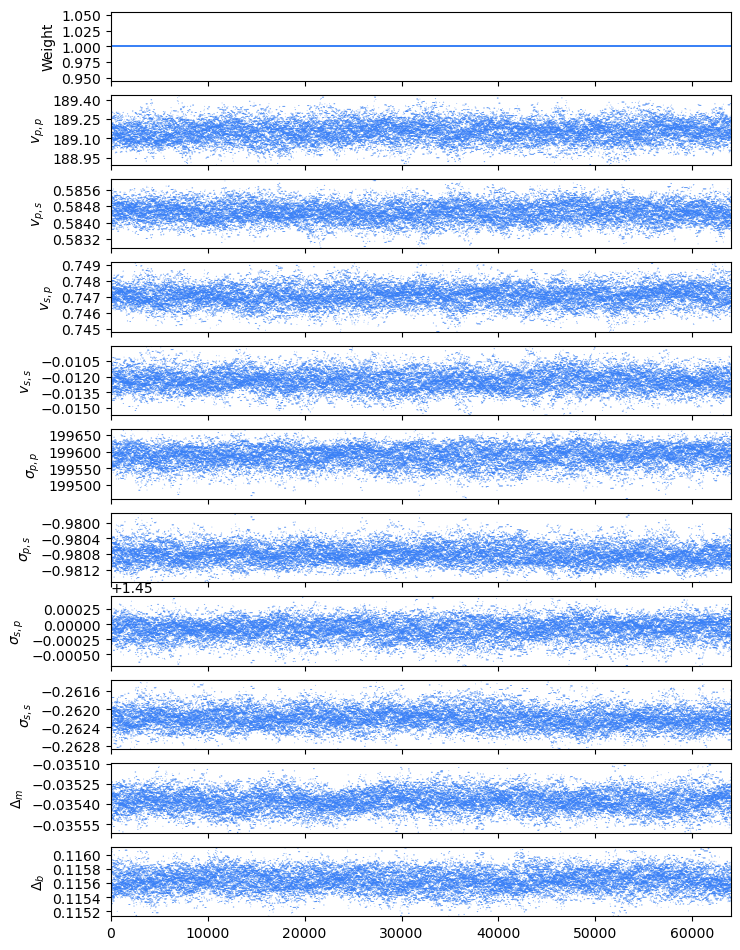

In [225]:
from chainconsumer import Chain, ChainConsumer

p_labels = [r'$v_{p, p}$', r'$v_{p, s}$', r'$v_{s, p}$', r'$v_{s, s}$', r'$\sigma_{p, p}$', r'$\sigma_{p, s}$', r'$\sigma_{s, p}$', r'$\sigma_{s, s}$', r'$\Delta_m$', r'$\Delta_b$']

chain = Chain.from_emcee(sampler, p_labels, name="Particle Rad Dist", discard=2000, thin=1)
consumer = ChainConsumer().add_chain(chain)

fig = consumer.plotter.plot_walks()

In [231]:
path = '/spiff/cosweeney/simulations/MDPL2/data/chains/'

file = h5.File(path+'radial_dist_simult_r_M_mcmc_final_4_30.h5', "r")
samples = file['chain']
nsteps, nwalkers, ndim = samples.shape 

flat_samples = samples[()].reshape((5000*32, 10))
flat_samples.shape

(160000, 10)

In [229]:
flat_samples.shape

(64000, 10)

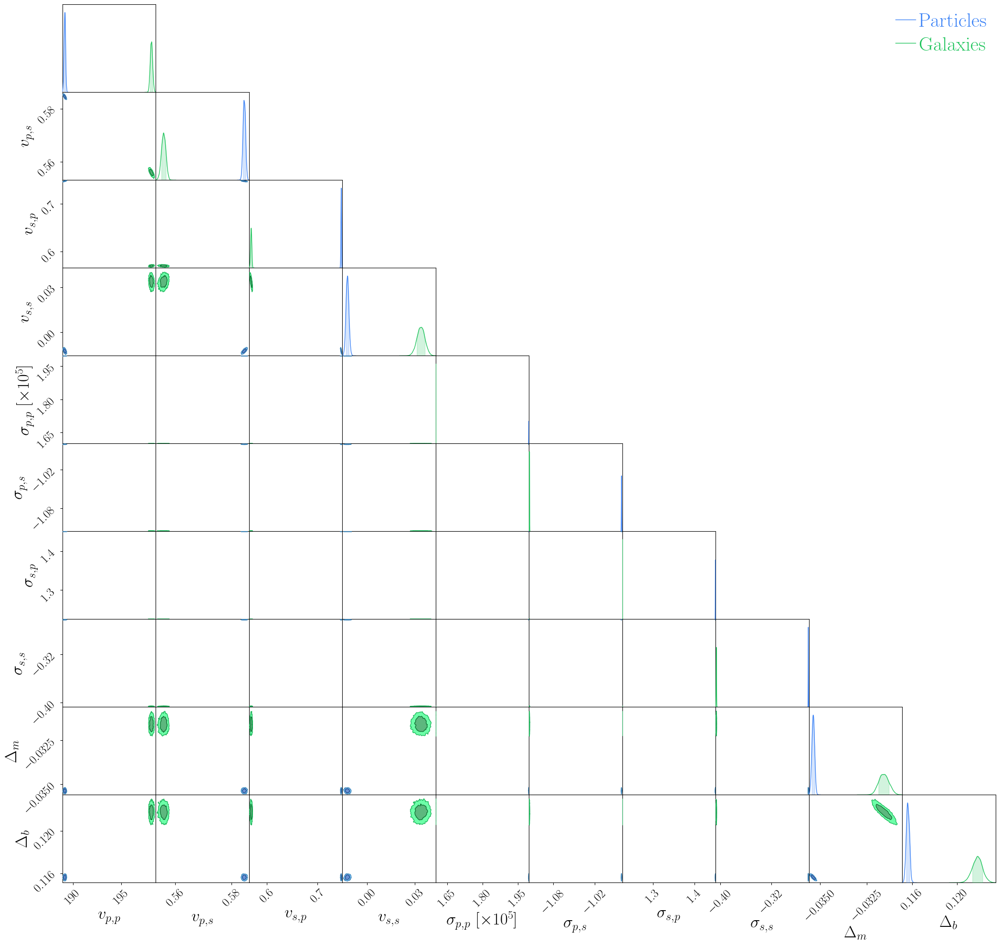

In [239]:
from chainconsumer import PlotConfig, Truth
import pandas as pd

labels = [r'$v_{p, p}$', r'$v_{p, s}$', r'$v_{s, p}$', r'$v_{s, s}$', r'$\sigma_{p, p}$', r'$\sigma_{p, s}$', r'$\sigma_{s, p}$', r'$\sigma_{s, s}$', r'$\Delta_m$', r'$\Delta_b$']

#Add galaxy chain
path = '/spiff/cosweeney/simulations/MDPL2/data/chains/'

file = h5.File(path+'radial_dist_simult_r_M_mcmc_final_4_30.h5', "r")
samples = file['chain']
nsteps, nwalkers, ndim = samples.shape 

flat_samples = samples[1000::1, :, :].reshape((-1, samples.shape[-1]))

c = ChainConsumer()


chain = Chain.from_emcee(sampler, p_labels, name="Particles", discard=2000, thin=1)
consumer = c.add_chain(chain)


df = pd.DataFrame(flat_samples, columns=labels)
#df["$\sigma_{p, p} \;[10^{6}]$"] = df["$\sigma_{p, p} \;[10^{6}]$"] / 1e6
#df["$\sigma_{s, p} \;[10^{-4}]$"] = df["$\sigma_{s, p} \;[10^{-4}]$"] / 1e-4
#df["$\sigma_c \;[10^{-5}]$"] = df["$\sigma_c \;[10^{-5}]$"] / 1e-5

c.add_chain(
    Chain(samples=df,
            name="Galaxies", 
            color='green'
               )
)

c.set_plot_config(PlotConfig(serif=True, 
                             usetex=True, 
                             max_ticks=2, 
                             tick_font_size=18,
                             label_font_size=25,
                             summary_font_size=12,
                             legend_kwargs={'fontsize':30}), 
                             )

# Make the corner-style plot
fig = c.plotter.plot()

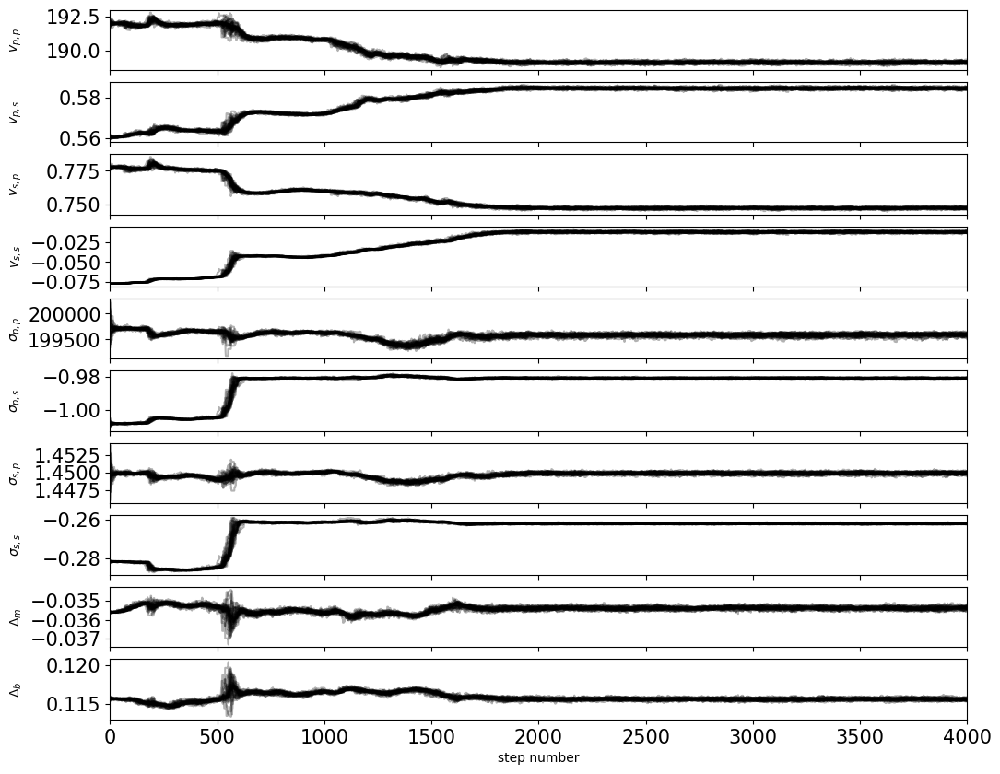

In [217]:
fig, axes = plt.subplots(ndim, figsize=(12, 10), sharex=True)
samples = sampler.get_chain()
labels = [r'$v_{p, p}$', r'$v_{p, s}$', r'$v_{s, p}$', r'$v_{s, s}$', r'$\sigma_{p, p}$', r'$\sigma_{p, s}$', r'$\sigma_{s, p}$', r'$\sigma_{s, s}$', r'$\Delta_m$', r'$\Delta_b$']
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples[:]))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)
    ax.tick_params(labelsize=15)

axes[-1].set_xlabel("step number"); 

(64000, 10)


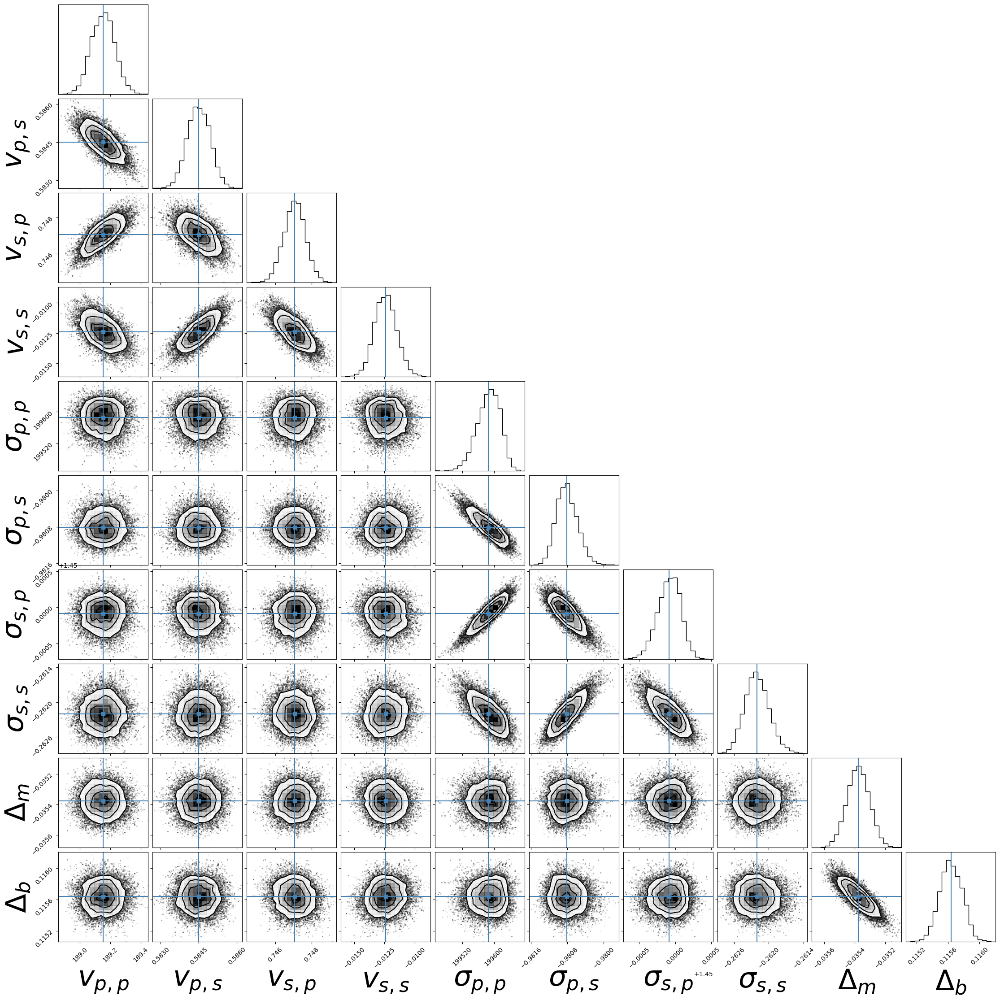

In [218]:
import corner

n_burn = 2000

flat_samples = sampler.get_chain(discard=n_burn, thin=1, flat=True)
print(flat_samples.shape)

fig = corner.corner(
    flat_samples, labels=labels, truths=np.mean(flat_samples, axis=0), bins=20, label_kwargs={"fontsize":45}, max_n_ticks=3#smooth=1, smooth1d=1,  #np.mean(flat_samples[:, :-1], axis=0) 
);

In [184]:
pBFs = np.mean(flat_samples, axis=0)
pBFs

array([ 1.88898160e+02,  5.54256741e-01,  7.24054138e-01, -8.14839107e-02,
        1.77181138e+05, -9.20289060e-01,  1.43859386e+00, -2.51300307e-01,
       -3.39743610e-02,  1.10778440e-01])

In [221]:
BFs = np.mean(flat_samples, axis=0)
BFs

array([ 1.89151774e+02,  5.84496355e-01,  7.47065625e-01, -1.24031446e-02,
        1.99586056e+05, -9.80806163e-01,  1.44991418e+00, -2.62201773e-01,
       -3.53775390e-02,  1.15636618e-01])

In [227]:
# save sampler 

path = '/spiff/cosweeney/simulations/MDPL2/data/chains/'

import pickle

with open(path+"radial_simult_M_r6.5_particles.pkl", "wb") as f:
    pickle.dump(sampler, f)

In [ ]:
# load sampler 
with open("radial_simult_M_r6.5_particles.pkl", "rb") as f:
    sampler = pickle.load(f)

In [186]:
# run while fixing all but vss
# MCMC 
import emcee 
from multiprocessing import Pool

pos = pBFs[3]*(1 + 1e-3 * np.random.randn(5, 1)) 
nwalkers, ndim = pos.shape

with Pool() as pool:
    one_sampler = emcee.EnsembleSampler(
        nwalkers, ndim, lprob_vss, pool=pool, #moves=[(emcee.moves.DEMove(), 0.8),(emcee.moves.DESnookerMove(), 0.2),],
    )

    one_sampler.run_mcmc(pos, 1_000, progress=True); 

print("Mean acceptance fraction: ", np.mean(one_sampler.acceptance_fraction)) 

100%|██████████| 1000/1000 [00:50<00:00, 19.97it/s]


Mean acceptance fraction:  0.7906000000000001


In [ ]:
import corner

n_burn = 100

flat_samples = sampler.get_chain(discard=n_burn, thin=1, flat=True)
print(flat_samples.shape)

fig = corner.corner(
    flat_samples, labels=labels, truths=np.mean(flat_samples, axis=0), bins=20, label_kwargs={"fontsize":45}, max_n_ticks=3#smooth=1, smooth1d=1,  #np.mean(flat_samples[:, :-1], axis=0) 
);

In [66]:
# bins for plots
select_indices = [2, 10, 25]
select_edges = [r_edges[i:i+2] for i in select_indices] #[edges[2:4], edges[7:9], edges[20:22]]
select_cens = [r_cens[i] for i in select_indices] #[cens[2], cens[7], cens[20]]

M_select_indices = [0, 5]
M_select_edges = [mbins[i:i+2] for i in M_select_indices] #[mbins[0:2], mbins[-2:]]
M_select_cens = [Mvirs[i] for i in M_select_indices] #[Mvirs[0], Mvirs[5]]


peak, 1-sigma vbin indices:  -250.0 -650.0 150.0
peak, 1-sigma vbin indices:  -150.0 -550.0 250.0
peak, 1-sigma vbin indices:  -50.0 -450.0 350.0
peak, 1-sigma vbin indices:  -350.0 -750.0 50.0
peak, 1-sigma vbin indices:  -150.0 -550.0 250.0
peak, 1-sigma vbin indices:  -50.0 -450.0 350.0


Text(0.5, 0.98, '$P(v_r|r)$ Individual Fits')

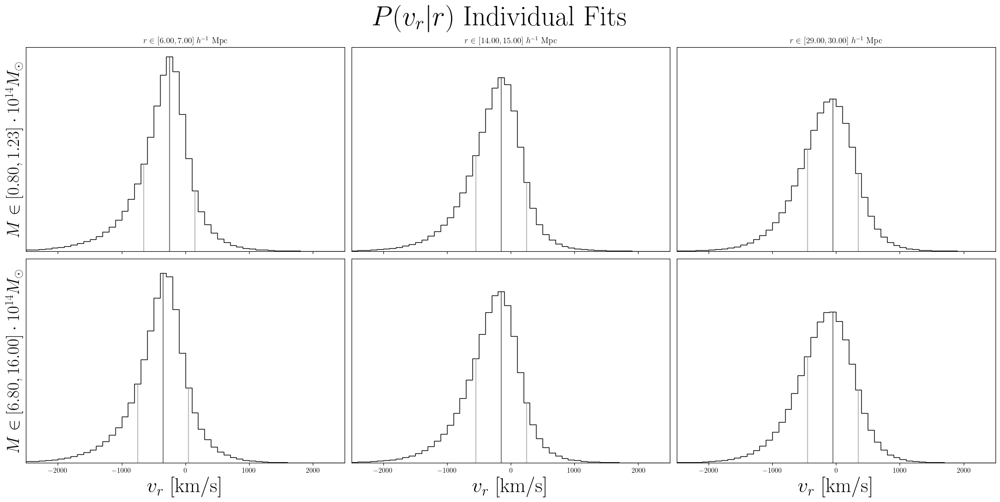

In [67]:


# Plot 
fig, ax = plt.subplots(len(M_select_cens), 3, figsize=(20, 10), sharey=True, sharex=True, layout='constrained')

xs = np.linspace(vedges[0], vedges[-1], 1000)

dv = np.diff(vedges)[0]

vr_select_indices = np.zeros((2, 3, 3), dtype=int)

for k in range(len(M_select_cens)):
    for i in range(len(select_cens)):

        hist = rcounts[ :, k, select_indices[i]] / np.sum(rcounts[ :, k, select_indices[i]]) / dv
        #model = marginal_radial_dist_indiv(xs, select_cens[i], shape_pars[k], rad_pars_indiv[k])

        #ax[k, i].scatter(vcens, hist, zorder=0, color='k')
        ax[k, i].hist(vcens, bins=vedges, weights=hist, color='k', histtype='step')
        #ax[k, i].plot(xs, model, color=cycle[k])
        ax[0, i].set_title(r'$r \in [{:.2f},  {:.2f}] \ h^{{-1}}$ Mpc'.format(select_edges[i][0], select_edges[i][1]))
        ax[k, i].margins(x=0)
        ax[k, i].set_xlim((-2500, 2500))
        ax[k, i].set_yticks([])
        ax[k, i].set_xticks([-2000, -1000, 0, 1000, 2000])
        ax[-1, i].set_xlabel(r'$v_r$ [km/s]', fontsize=30)
        ax[k, 0].set_ylabel(r'$M \in [{:.2f}, {:.2f}] \cdot 10^{{14}} M_\odot$'.format(M_select_edges[k][0]/1e14, M_select_edges[k][1]/1e14), fontsize=25)
        var = np.average((vcens - np.average(vcens, weights=hist))**2, weights=hist)
        std = np.sqrt(var)
        std_ind = int(std // dv)
        peak_ind = np.argmax(hist)

        vr_select_indices[k, i, :] = peak_ind-std_ind, peak_ind, peak_ind+std_ind  

        print("peak, 1-sigma vbin indices: ",vcens[peak_ind], vcens[peak_ind-std_ind], vcens[peak_ind+std_ind])
        ax[k, i].vlines([vcens[peak_ind], vcens[peak_ind-std_ind], vcens[peak_ind+std_ind]], [0, 0, 0], [hist[peak_ind], hist[peak_ind-std_ind], hist[peak_ind+std_ind]], colors=['k', 'gray', 'gray'], alpha=0.5)
fig.suptitle(r"$P(v_r|r)$ Individual Fits", fontsize=40) 

### Fit Conditional Distributions:

In [32]:
# Fit cond distributions. Check Histograms
from scipy.stats import johnsonsu, t
from scipy.optimize import curve_fit

cond_sig_p = np.zeros((bin_num, len(Mvirs), len(r_cens)))
cond_sig_err_p = np.zeros((bin_num, len(Mvirs), len(r_cens)))

dv = np.diff(vedges)[0]
vcens = 0.5*(vedges[1:]+vedges[:-1])
v_range = np.linspace(vedges[0], vedges[-1], 1000)

ccounts = np.zeros(JH_p.shape)

for k in range(len(Mvirs)):
    #fig, ax = plt.subplots(len(bin_num), len(r_cens), figsize=(100, 20)) 

    for j in range(bin_num):
        for i in range(len(r_cens)):

            cond_p = JH_p[j, :, k, i] / np.sum(JH_p[j, :, k, i] +1e-8) / dv 
            cond_p_sig = np.sqrt(JH_p[j, :, k, i]+1) / np.sum(JH_p[j, :, k, i] +1) / dv 
            ccounts[:, j, k, i] = cond_p

            p, c = curve_fit(lambda x, s: t.pdf(x, df=5, scale=s), vcens, cond_p, sigma=cond_p_sig, p0=500, maxfev=10_000, absolute_sigma=True)

            cond_sig_p[j, k, i] = p
            cond_sig_err_p[:, k, i] = np.sqrt(np.diag(c)) 

            #ax[k, i].scatter(vcens, cond_p, c=f"C{str(k)}")
            #ax[k, i].plot(v_range, t.pdf(v_range, df=5, scale=p), c=f"C{str(k)}") 

/tmp/ipykernel_189199/4084717742.py:26: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cond_sig_p[j, k, i] = p
/tmp/ipykernel_189199/4084717742.py:24: OptimizeWarning: Covariance of the parameters could not be estimated
  p, c = curve_fit(lambda x, s: t.pdf(x, df=5, scale=s), vcens, cond_p, sigma=cond_p_sig, p0=500, maxfev=10_000, absolute_sigma=True)


In [36]:
np.isnan(cond_sig_err_p[:, -1, :]).sum()/len(cond_sig_err_p[:, -1, :].flatten())

np.float64(0.0)

In [33]:
# handle infs
cond_sig_err_p[np.isinf(cond_sig_err_p)] = np.max(cond_sig_err_p[~np.isinf(cond_sig_err_p)])

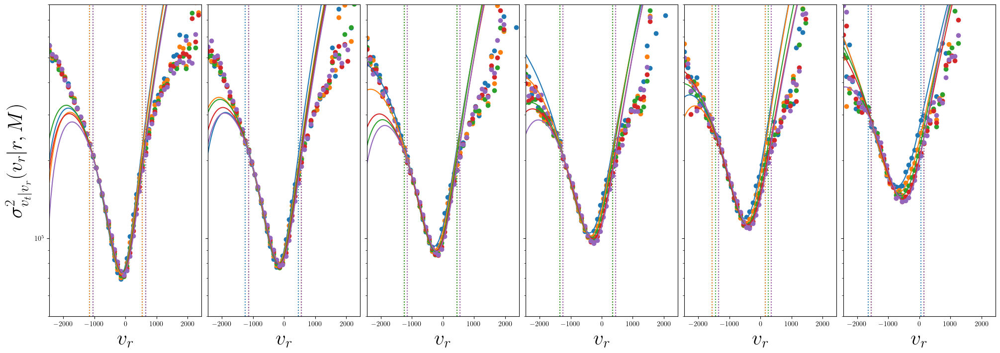

In [82]:
# plot dependence of variance on vr, r, M

fig, ax = plt.subplots(1, len(Mvirs), figsize=(20, 7), sharey=True, layout='constrained')

for k in range(len(Mvirs)):    
    for i in range(len(r_cens[3:-3]) // 4): 
        mean_var = np.mean((cond_sig_p[:, k, 3:-3]**2)[:, i:i+4], axis=-1)
        mean_unc = 2*np.sqrt(mean_var)*np.mean((cond_sig_err_p[:, k, 3:-3])[:, i:i+4], axis=-1)
        ind = np.argmin(mean_var)
        lshift = 10
        rshift = 7
        vs = np.linspace(vcens[0], vcens[-1], 100)

        p, c = curve_fit(lambda x, s_c, s_m, s_q, s_0: s_c*(x-s_m)**3 + s_q*(x-s_m)**2 + s_0, vcens[ind-lshift:ind+rshift], mean_var[ind-lshift:ind+rshift], maxfev=1_000, p0=[1e-5, -100, 0.1, np.min(mean_var)], sigma=mean_unc[ind-lshift:ind+rshift], absolute_sigma=True)

        ax[k].scatter(vcens, mean_var, c=f'C{str(i)}')
        ax[k].plot(vs, p[0]*(vs-p[1])**3 + p[2]*(vs-p[1])**2 + p[3], c=f'C{str(i)}')
        ax[k].axvline(vcens[ind-lshift], c=f'C{str(i)}', ls=':')
        ax[k].axvline(vcens[ind+rshift], c=f'C{str(i)}', ls=':') 
        ax[k].set_xlabel(r"$v_r$", fontsize=30)
        ax[0].set_ylabel(r"$\sigma_{v_t|v_r}^2(v_r|r, M)$", fontsize=30)  
        ax[k].set_ylim((5e4, 0.8e6))      
        ax[k].set_yscale('log')
        ax[k].margins(x=0)

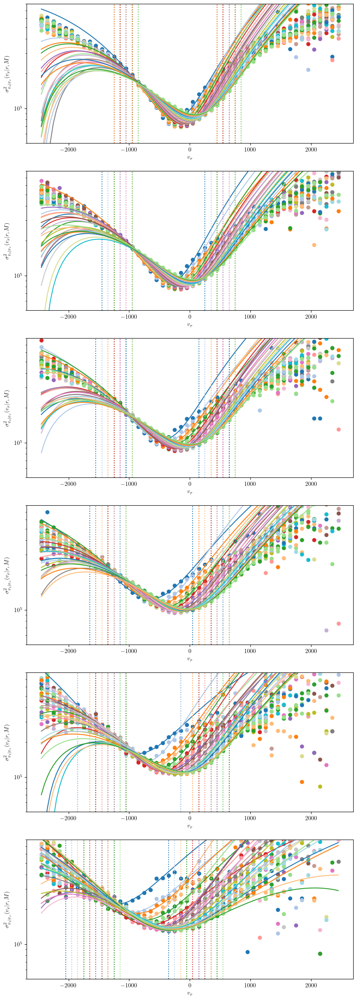

In [6]:
tab20 = plt.get_cmap('tab20')
cycle2 = [tab20(i) for i in range(tab20.N)]  

sig_pars = np.zeros((4, len(Mvirs), len(r_cens)))
sig_errs = np.zeros(sig_pars.shape)

fig, ax = plt.subplots(len(Mvirs), figsize=(10, 30))

for k in range(len(Mvirs)):    
    for i in range(len(r_cens)): 
        var = cond_sig_p[:, k, i]**2 #np.mean((cond_sig_p[:, k, 3:-3]**2)[:, i:i+4], axis=-1)
        var[np.isinf(var)] = np.max(var[~np.isinf(var)])
        #mean_unc = 2*np.sqrt(mean_var)*np.mean((cond_sig_err_p[:, k, 3:-3])[:, i:i+4], axis=-1)
        ind = np.argmin(var[vcens < 500])
        lshift = 10 
        rshift = 7
        vs = np.linspace(vcens[0], vcens[-1], 100)

        p, c = curve_fit(lambda x, s_c, s_m, s_q, s_0: s_c*(x-s_m)**3 + s_q*(x-s_m)**2 + s_0, vcens[ind-lshift:ind+rshift], var[ind-lshift:ind+rshift], maxfev=1_000, p0=[1e-5, -100, 0.1, np.min(var)])
        sig_pars[:, k, i] = p
        sig_errs[:, k, i] = np.sqrt(np.diag(c))

        ax[k].scatter(vcens, var, c=cycle2[i%len(cycle2)])
        ax[k].plot(vs, p[0]*(vs-p[1])**3 + p[2]*(vs-p[1])**2 + p[3], c=cycle2[i%len(cycle2)])
        ax[k].axvline(vcens[ind-lshift], c=cycle2[i%len(cycle2)], ls=':')
        ax[k].axvline(vcens[ind+rshift], c=cycle2[i%len(cycle2)], ls=':') 
        ax[k].set_xlabel(r"$v_r$")
        ax[k].set_ylabel(r"$\sigma_{v_t|v_r}^2(v_r|r, M)$")  
        ax[k].set_ylim((5e4, 0.8e6))      
        ax[k].set_yscale('log')


(2, 2, 6) (2, 2, 6) (2, 6)


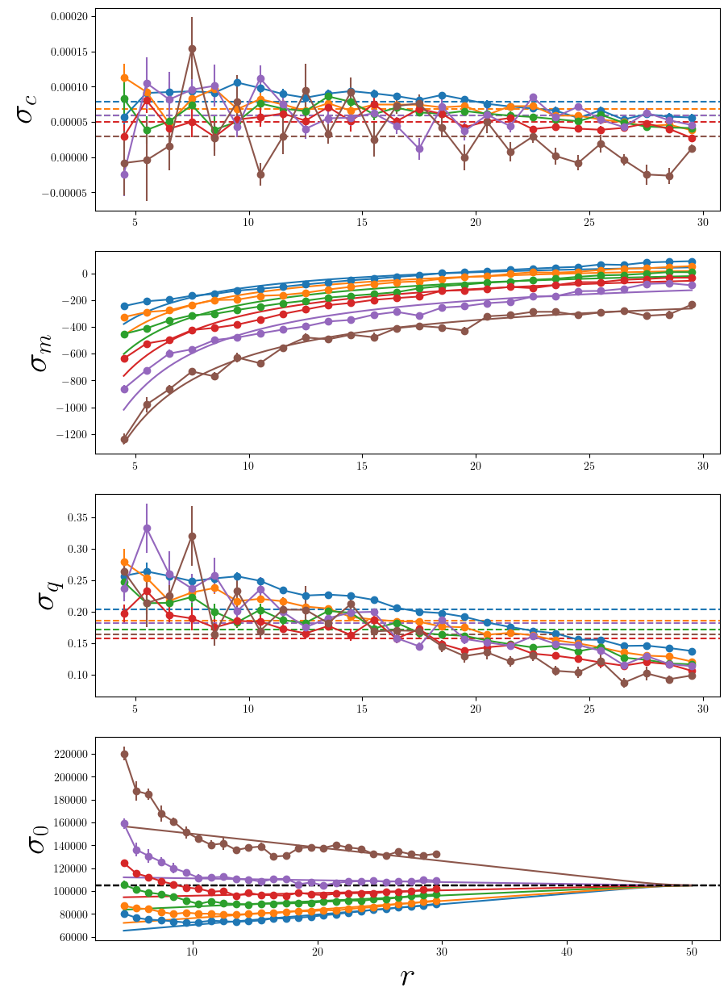

In [7]:
fig, ax = plt.subplots(4, figsize=(10, 15), sharex=False)

labels = [r"$\sigma_c$", r"$\sigma_m$", r"$\sigma_q$", r"$\sigma_0$"]

sig_par_pars = np.zeros((2, 2, len(Mvirs)))
sig_par_errs = np.zeros(sig_par_pars.shape)

sig_par_means = []#np.zeros((2, len(Mvirs)))

rs = np.linspace(r_cens[0], r_cens[-1], 100)

for i in range(4):
    for k in range(len(Mvirs)):
        ax[i].errorbar(r_cens, sig_pars[i, k, :], sig_errs[i, k, :], fmt='o-')
        ax[i].set_ylabel(labels[i],fontsize=30)

        if i == 0 or i == 2:
            ax[i].axhline(np.mean(sig_pars[i, k, :]), ls='--', c=f'C{str(k)}')
            sig_par_means.append(np.mean(sig_pars[i, k, :]))
        if i == 1:
            cutoff = 0
            ind = 0

            p, c = curve_fit(lambda x, m, b: m/x+b, r_cens[cutoff:], sig_pars[i, k, cutoff:], sigma=sig_errs[i, k, cutoff:])
            sig_par_pars[ind, :, k] = p
            sig_par_errs[ind, :, k] = np.sqrt(np.diag(c))

            ax[i].plot(rs, p[0]/rs+p[1], c=f'C{str(k)}')
        if i == 3:
            cutoff = 2
            ind = 1

            p, c = curve_fit(lambda x, m: m*np.log(1+np.exp(-(x-48)))+105_000 , r_cens[cutoff:], sig_pars[i, k, cutoff:], sigma=sig_errs[i, k, cutoff:])
            sig_par_pars[ind, :, k] = p
            sig_par_errs[ind, :, k] = np.sqrt(np.diag(c))

            rs = np.linspace(r_cens[0], 50, 100)

            ax[i].plot(rs, p*np.log(1+np.exp(-(rs-48)))+105_000, c=f'C{str(k)}')
            ax[i].axhline(105_000, c='k', ls='--')

ax[-1].set_xlabel(r"$r$" ,fontsize=30)

#sig_par_pars = np.array(sig_par_pars).reshape((2, 2, len(Mvirs)))
#sig_par_errs = np.array(sig_par_errs).reshape((2, 2, len(Mvirs)))
sig_par_means = np.array(sig_par_means).reshape((2, len(Mvirs)))
print(sig_par_pars.shape,sig_par_errs.shape, sig_par_means.shape )

In [6]:
def power_law(x, p, s):
    return p * x ** s

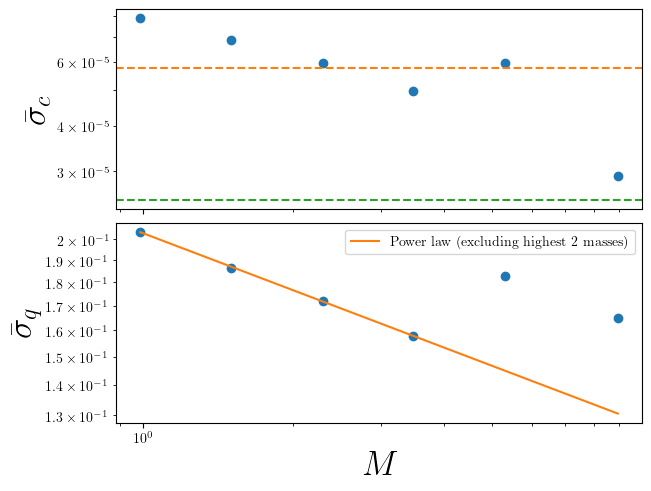

In [13]:
# mass dependence
fig, ax = plt.subplots(2, layout='constrained', sharex=True)

labels = [r'$\bar \sigma_c$', r'$\bar \sigma_q$']

sigma_init = np.zeros(9)

for i in range(2):
    ax[i].scatter(Mvirs/1e14, sig_par_means[i, :])
    ax[1].set_xlabel(r'$M$', fontsize=25)
    ax[i].set_ylabel(labels[i], fontsize=25)
    ax[i].set_xscale('log')
    ax[i].set_yscale('log')

ax[0].axhline(np.mean(sig_par_means[0, :]), c='C1', ls='--', label=r'Mean of $\bar \sigma_c$')
ax[0].axhline(2.5e-5, c='C2', ls='--', label='Mean for galaxies')

sigma_init[0] = np.mean(sig_par_means[0, :])

p, c = curve_fit(power_law, Mvirs[:4]/1e14, sig_par_means[1, :4])

sigma_init[1:3] = p

ms = np.linspace(Mvirs[0]/1e14, Mvirs[-1]/1e14, 100)
ax[1].plot(ms, power_law(ms, p[0], p[1]), c='C1', label='Power law (excluding highest 2 masses)')
ax[1].legend(fontsize=10) 

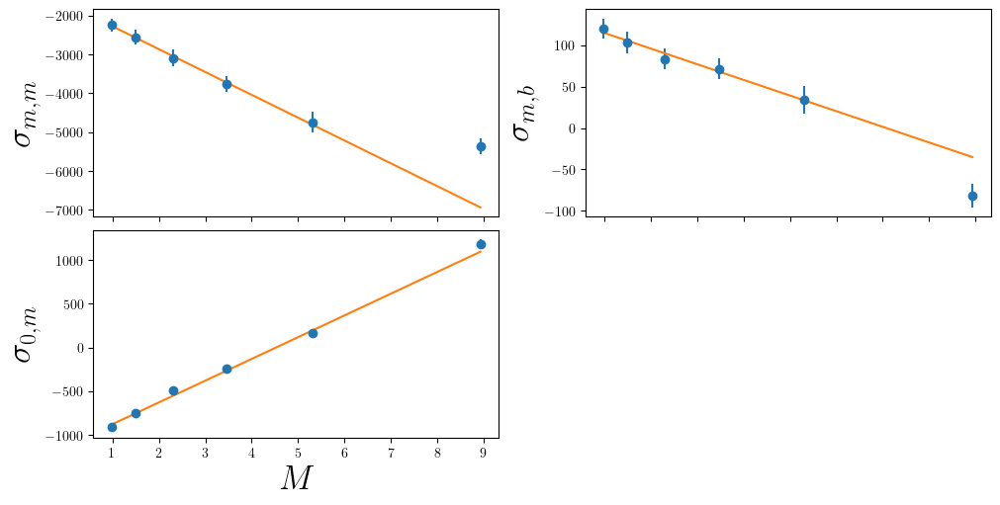

In [15]:
fig, ax = plt.subplots(2, 2, figsize=(10, 5), layout='constrained', sharex=True)

labels = [[r'$\sigma_{m,m}$', r'$\sigma_{m,b}$'], [r'$\sigma_{0,m}$', r'$\sigma_{0,b}$']]
pars = []

for i in range(2):
    for j in range(2):
        if i == 1 and j == 1:
            pass
        else:
            ax[i, j].errorbar(Mvirs/1e14, sig_par_pars[i, j, :], sig_par_errs[i, j, :], fmt='o')
            p, c = curve_fit(lambda x, m, b: m*x+b, Mvirs[:-1]/1e14, sig_par_pars[i, j, :-1], sigma=sig_par_errs[i, j, :-1])
            ax[i, j].plot(ms, p[0]*ms+p[1], c='C1')
            ax[1, j].set_xlabel(r"$M$", fontsize=25)
            ax[i, j].set_ylabel(labels[i][j], fontsize=25)
            pars.append(p)

ax[1, 1].axis('off')

sigma_init[3:5] = pars[0]
sigma_init[5:7] = pars[1]
sigma_init[7:] = pars[2]

In [9]:
# check initialization 

def line(x,m,b):
    return m*x+b

def conditional_tangential_dist(vt, vr, r, M, pars):
    """The smooth model for the conditional tangential 
    velocity distribution P(v_t|v_r, r, M). 

    This is a Student's t distribution with a fixed 
    degree of freedom (dof) parameter characterizing 
    the kurtosis of the distribution. The remaining 
    dependences are captured in the variance. 

    Args:
        v_t (np.ndarray): tangential velocity bin centers.
        v_r (_type_): radial velocity bin center.
        r (_type_): radial distance bin center.
        M (float): Mass bin median.
        pars (_type_): parameters defining the radial dependence.
    """

    s_c, s_qm, s_qb, s_mmm, s_mmb, s_mbm, s_mbb, s_0mm, s_0mb = pars

    dof = 5 # degrees of freedom, "shape" parameter
    s_0p = 48 # h^-1 Mpc, transition of sigma_vt^2 minimum to a constant
    s_0c = 105_000 # km^2 s^-2, minimum value as r -> 00 
    
    M_pivot = 1e14 # M_sun

    m = M / M_pivot

    # Mass dependence 
    s_q = power_law( m, s_qm, s_qb)
    s_mm = line( m, s_mmm, s_mmb)
    s_mb = line( m, s_mbm, s_mbb)
    s_0m = line( m, s_0mm, s_0mb)

    s_m = s_mm / r + s_mb
    s_0 = s_0m * np.log( 1 + np.exp( - (r - s_0p))) + s_0c 

    if vr > -2_000:
        variance = s_c * ( vr - s_m ) ** 3 + s_q * ( vr - s_m ) ** 2 + s_0
    else:
        test_vr = np.linspace(-2000, -1000, 100) 
        p, _ = curve_fit(line, test_vr, s_c * ( test_vr - s_m ) ** 3 + s_q * ( test_vr - s_m ) ** 2 + s_0)
        variance = line(vr, p[0], p[1]) #s_c * ( vr[None, :, None] - s_m ) ** 3 + s_q * ( vr[None, :, None] - s_m ) ** 2 + s_0 #s_q * ( vr[None, :, None] - s_m ) ** 2 + s_0
        #plt.plot(test_vr, line(test_vr, p[0], p[1])) 
        #plt.plot(test_vr, s_c * ( test_vr[None, :, None] - s_m ) ** 3 + s_q * ( test_vr[None, :, None] - s_m ) ** 2 + s_0)
    scale = np.sqrt( variance )

    dist = t.pdf(vt, df=dof, scale=scale)

    return dist


def conditional_tangential_dist_vec(vt, vr, r, M, pars):

    s_c, s_qm, s_qb, s_mmm, s_mmb, s_mbm, s_mbb, s_0mm, s_0mb = pars

    dof = 5 # degrees of freedom, "shape" parameter
    s_0p = 48 # h^-1 Mpc, transition of sigma_vt^2 minimum to a constant
    s_0c = 105_000 # km^2 s^-2, minimum value as r -> 00 
    
    M_pivot = 1e14 # M_sun

    m = M[None, :, None] / M_pivot

    # Mass dependence 
    s_q = power_law( m, s_qm, s_qb)
    s_mm = line( m, s_mmm, s_mmb)
    s_mb = line( m, s_mbm, s_mbb)
    s_0m = line( m, s_0mm, s_0mb)

    s_m = s_mm / r[None, None, :] + s_mb
    s_0 = s_0m * np.log( 1 + np.exp( - (r[None, None, :] - s_0p))) + s_0c 

    variance = s_c * ( vr[:, None, None] - s_m ) ** 3 + s_q * ( vr[:, None, None] - s_m ) ** 2 + s_0

    scale = np.sqrt( variance )

    dist = t.pdf(vt[:, np.newaxis, np.newaxis, np.newaxis], df=dof, scale=scale[np.newaxis, :, :, :])

    return dist

In [17]:
print(sigma_init)

[ 5.75787440e-05  2.02894205e-01 -2.01678175e-01 -5.86846429e+02
 -1.69197072e+03 -1.89489498e+01  1.34078756e+02  2.48442785e+02
 -1.12311259e+03]


In [5]:
sigma_init = ([ 5.75787440e-05,  2.02894205e-01, -2.01678175e-01, -5.86846429e+02, -1.69197072e+03, -1.89489498e+01,  1.34078756e+02,  2.48442785e+02, -1.12311259e+03])

Text(0.5, 0.98, '$P(v_t|v_r, r)$ Initialization, Particles')

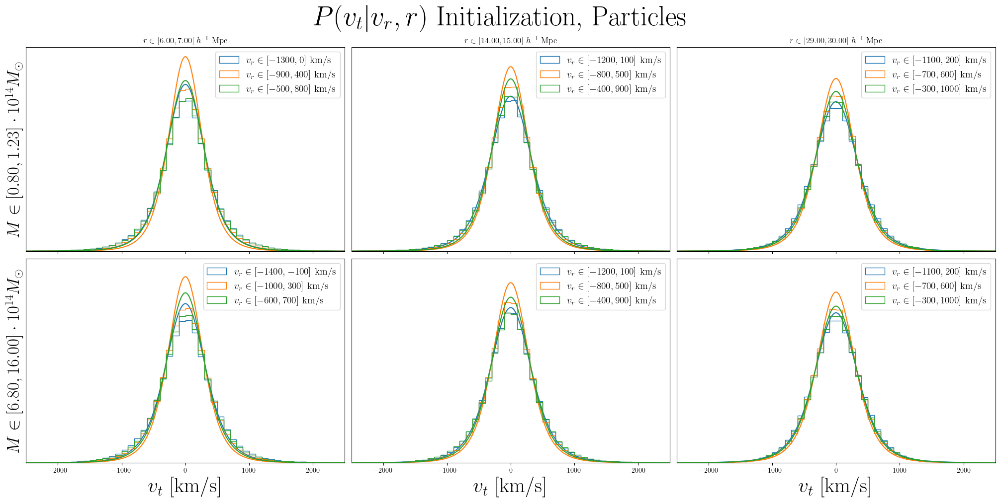

In [93]:
# Plot 
fig, ax = plt.subplots(len(M_select_cens), 3, figsize=(20, 10), sharey=True, sharex=True, layout='constrained')

xs = np.linspace(vedges[0], vedges[-1], 1000)

dv = np.diff(vedges)[0]

min_off = 2*3
max_off = min_off+1
scaling = min_off+max_off

vr_select_edges = np.array([vedges[vr_select_indices-min_off], vedges[vr_select_indices+max_off]]) #[[[vedges[i-2:i+3] for i in vr_select_indices[j][k]] for j in range(vr_select_indices.shape[0])] for k in range(vr_select_indices.shape[1]) ] #[[vedges[34:36], vedges[77:79]], [vedges[53:55], vedges[74:76]]] 
vr_select_cens = vcens[vr_select_indices.astype(int)] 
vr_select_edges = vr_select_edges.transpose([1, 2, 3, 0])

for k in range(len(M_select_cens)):
    for j in range(len(select_cens)):
        for i in range(len(vr_select_cens[k])):
            #ccounts[:, j, k, i]
            hist = np.mean(ccounts[:, vr_select_indices[k][j][i]-min_off:vr_select_indices[k][j][i]+max_off, k, select_indices[j]] , axis=-1)# * scaling
            #np.mean(joint_hists[k, select_indices[j], vr_select_indices[k][j][i]-min_off:vr_select_indices[k][j][i]+max_off] / np.sum(joint_hists[k, select_indices[j], vr_select_indices[k][j][i]-min_off:vr_select_indices[k][j][i]+max_off]) / dv, axis=0) * scaling
            model = conditional_tangential_dist(xs, vr_select_cens[k][j][i], select_cens[j], Mvirs[k], BF)
            #conditional_tangential_dist_indiv(xs, vr_select_cens[k][j][i], select_cens[j], tan_pars_indiv[k])
            #counts = np.sum(joint_hists[k, select_indices[j], vr_select_indices[k][j][i]-min_off:vr_select_indices[k][j][i]+max_off])
            #print('Counts: ', counts, 'approx num of bins: ', np.sqrt(counts))
            #print(np.sum(hist)*dv)
            
            ax[k, j].hist(vcens, bins=vedges, weights=hist, color=f"C{str(i)}", histtype='step', label=r'$v_r\in[{:.0f}, {:.0f}]$ km/s'.format(vr_select_edges[k][j][i][0], vr_select_edges[k][j][i][1]))
            #ax[k, j].scatter(vcens, hist, color=f"C{str(i)}", label=r'$v_r\in[{:.0f}, {:.0f}]$ km/s'.format(vr_select_edges[k][j][i][0], vr_select_edges[k][j][i][1]))
            ax[k, j].plot(xs, model, color=f"C{str(i)}")
            ax[0, j].set_title(r'$r \in [{:.2f},  {:.2f}] \ h^{{-1}}$ Mpc'.format(select_edges[j][0], select_edges[j][1]))
            ax[k, j].margins(x=0)
            ax[k, j].set_yticks([])
            ax[k, j].set_xlim((-2500, 2500))
            ax[k, j].set_xticks([-2000, -1000, 0, 1000, 2000])
            ax[-1, j].set_xlabel(r'$v_t$ [km/s]', fontsize=30)
            ax[k, 0].set_ylabel(r'$M \in [{:.2f}, {:.2f}] \cdot 10^{{14}} M_\odot$'.format(M_select_edges[k][0]/1e14, M_select_edges[k][1]/1e14), fontsize=25)
            ax[k, j].legend(loc='upper right', fontsize=14)
fig.suptitle(r"$P(v_t|v_r, r)$ Initialization, Particles", fontsize=40) 

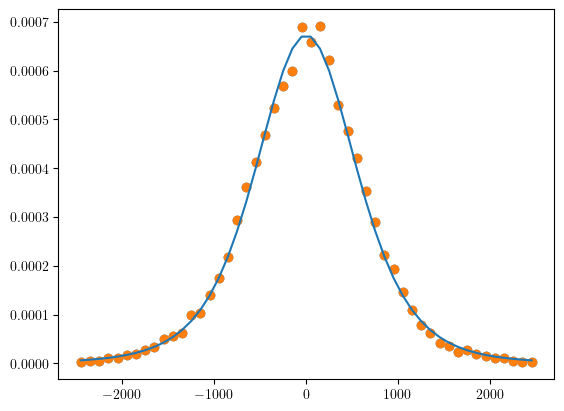

In [49]:
model =  conditional_tangential_dist_vec(vcens, vcens, r_cens, Mvirs, sigma_init)
plt.scatter(vcens, ccounts[:, 10, 0, 10])
plt.scatter(vcens, JH_p[10, :, 0, 10]/np.sum(JH_p[10, :, 0, 10])/dv)
plt.plot(vcens, model[:, 10, 0, 10])

In [48]:
print(np.sum(ccounts[:, 10, 0, 10], axis=0),np.sum(JH_p[10, :, 0, 10], axis=0))

0.009999999999691795 16223.0


In [23]:
JH_p.shape 

(50, 50, 6, 26)

In [57]:
(JH_p == 0).sum() / len(JH_p.flatten())

np.float64(0.19673333333333334)

In [94]:
# MLE 
# JH_p = np.zeros((vr, vt, len(Mvirs), len(r_cens)))
#Joint_Hists = np.zeros((len(Mvirs), len(rcens), 100, 100))
#(6, 50, 26, 1000)
import scipy

def Pllh(pars):
    N = np.sum(JH_p[:, :, :, 2:], axis=1)[:, np.newaxis, :] #Num of gals in distribution in vr+r+M
    #dv = 5000 / 100 
    P = conditional_tangential_dist_vec(vcens, vcens, r_cens[2:], Mvirs, pars).transpose([1, 0, 2, 3]) 
    n = JH_p[:, :, :, 2:] # Num of gals in vel bin

    lam = P*dv*N 
    #print(lam.shape)
    log_likelihood = np.sum(scipy.stats.poisson.logpmf(k=n, mu=lam)) 
    
    return log_likelihood 

def log_prior(pars):
    sig_c, sig_qm, sig_qb, sig_mmm, sig_mmb, sig_mbm, sig_mbb, sig_0mm, sig_0mb = pars 

    #if 0 < sig_c < np.inf and -np.inf < sig_qm < 0 and 0 < sig_qb < np.inf and -np.inf < sig_mmm < 0 and -np.inf < sig_mmb < 0 and -np.inf < sig_mbm < np.inf and 0 < sig_mbb < np.inf and -np.inf < sig_0mm < 0 and 0 < sig_0mb < np.inf and 0 < sig_0bm < np.inf and 0 < sig_0bb < np.inf:
    if 0 < sig_c < np.inf and -np.inf < sig_qm < 0 and 0 < sig_qb < np.inf and -np.inf < sig_mmm < 0 and -np.inf < sig_mmb < 0 and -np.inf < sig_mbm < 0.0 and 0 < sig_mbb < np.inf and 0.0 < sig_0mm < np.inf and -np.inf < sig_0mb < 0.0:
    #[ 2.50000000e-05,          1.37636214e-01,          1.56180701e-02,               -6.71792886e+02,        -1.08717631e+03,          -1.28629027e+01,        8.28302190e+01,              2.60455971e+02,          -1.07799451e+03]    
        return 0.0
    return -np.inf 

def inform_log_prior(pars):
    sig_c, sig_qm, sig_qb, sig_mmm, sig_mmb, sig_mbm, sig_mbb, sig_0mm, sig_0mb = pars 

    if 0.0 <= sig_c <= 1e-4 and 0 <= sig_qm <= 1e2 and -10 <= sig_qb <= 0 and -1500 <= sig_mmm <= -200 and -5_000 <= sig_mmb <= 0 and -1000 <= sig_mbm <= 100 and 0 <= sig_mbb <= 1_000 and 0 <= sig_0mm <= 1_000 and -5_000 <= sig_0mb <= 0 : #and 0 <= sig_0bm <= 70_000 and 0 <= sig_0bb <= 300_000
        return 0.0
    return -np.inf 

def lprob(pars):
    lp = inform_log_prior(pars)
    if not np.isfinite(lp):
        return -np.inf
    return lp + Pllh(pars) 

print(Pllh(soln.x), Pllh(BF), Pllh(g_BF))

-1251870.7109977978 -1251870.7397774784 -1323933.317937669


In [63]:
soln = scipy.optimize.minimize(lambda p: -lprob(p), sigma_init, method='nelder-mead')
print("Initial: ",sigma_init) 
print("MLE: ", soln.x) 

Initial:  [5.7578744e-05, 0.202894205, -0.201678175, -586.846429, -1691.97072, -18.9489498, 134.078756, 248.442785, -1123.11259]
MLE:  [ 3.38280735e-05  1.51790241e-01 -8.12947832e-02 -6.37485918e+02
 -1.42679039e+03 -1.79036940e+01  1.20180999e+02  2.82321065e+02
 -1.08116835e+03]


In [101]:
# MCMC
import emcee
from multiprocessing import Pool  

pos = soln.x*(1 + 1e-4 * np.random.randn(32, soln.x.shape[0]))
nwalkers, ndim = pos.shape

with Pool() as pool:
    sampler = emcee.EnsembleSampler(
        nwalkers, ndim, lprob, pool=pool, #moves=emcee.moves.StretchMove(),
    )

    sampler.run_mcmc(pos, 1000, progress=True); 

print("Mean acceptance fraction: ", np.mean(sampler.acceptance_fraction)) 

100%|██████████| 1000/1000 [05:23<00:00,  3.09it/s]

Mean acceptance fraction:  0.43975000000000003


In [97]:
# MCMC, starting at galaxy best fit
import emcee
from multiprocessing import Pool  

pos = g_BF*(1 + 1e-4 * np.random.randn(32, g_BF.shape[0]))
nwalkers, ndim = pos.shape

with Pool() as pool:
    sampler = emcee.EnsembleSampler(
        nwalkers, ndim, lprob, pool=pool, #moves=emcee.moves.StretchMove(),
    )

    sampler.run_mcmc(pos, 1000, progress=True); 

print("Mean acceptance fraction: ", np.mean(sampler.acceptance_fraction)) 

100%|██████████| 1000/1000 [05:14<00:00,  3.18it/s]

Mean acceptance fraction:  0.4266875


In [104]:
# save sampler 

path = '/spiff/cosweeney/simulations/MDPL2/data/chains/'

import pickle

with open(path+"tangential_simult_M_r6.5_particles.pkl", "wb") as f:
    pickle.dump(sampler, f)

In [86]:
# if needed, continue chain
samples = sampler.get_chain()

pos = samples[-1]#soln * (1 + 1e-1 * np.random.randn(32, soln.shape[0]))
nwalkers, ndim = pos.shape

with Pool() as pool:
    sampler = emcee.EnsembleSampler(
        nwalkers, ndim, lprob, pool=pool, #moves=emcee.moves.StretchMove(),
    ) 

    sampler.run_mcmc(pos, 2000, progress=True); 

print("Mean acceptance fraction: ", np.mean(sampler.acceptance_fraction)) 

100%|██████████| 2000/2000 [12:35<00:00,  2.65it/s]

Mean acceptance fraction:  0.367625


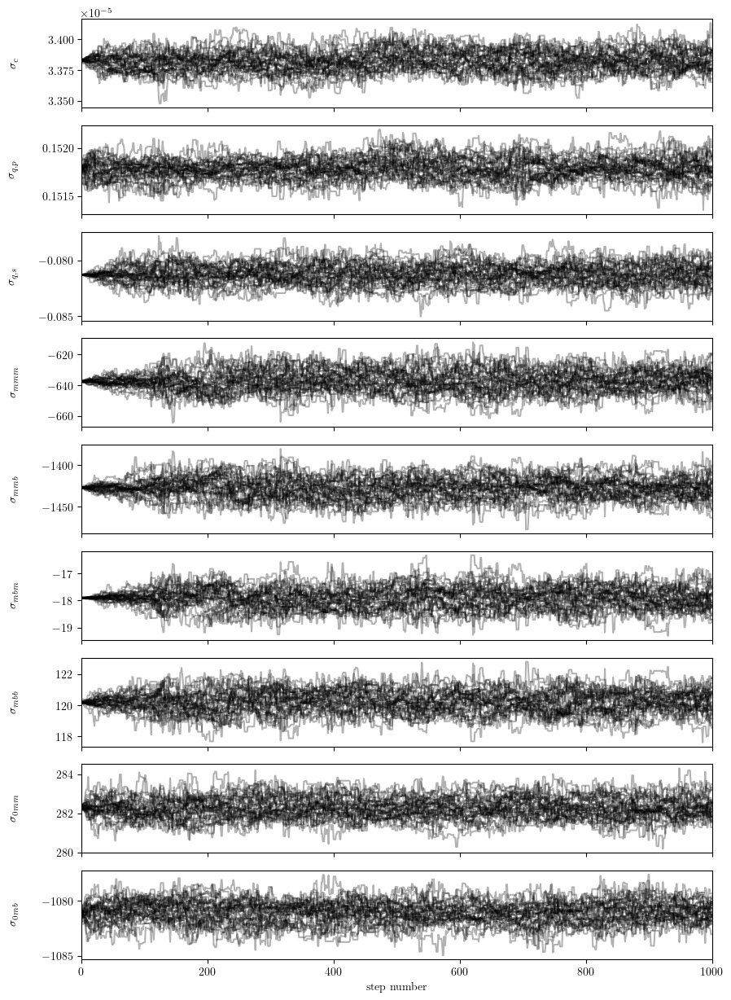

In [102]:
fig, axes = plt.subplots(ndim, figsize=(10, 15), sharex=True)
samples = sampler.get_chain()
labels = [r"$\sigma_c$", r"$\sigma_{q, p}$", r"$\sigma_{q, s}$", r"$\sigma_{mmm}$", r"$\sigma_{mmb}$", r"$\sigma_{mbm}$", r"$\sigma_{mbb}$", r"$\sigma_{0mm}$", r"$\sigma_{0mb}$"]
#['a', 'bp', 'bs', 'mpm', 'mpb', 'mcm', 'mcb', 'cmm', 'cmb', 'cbm', 'cbb']

for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5) 

axes[-1].set_xlabel("step number"); 


In [92]:

flat_samples = sampler.get_chain(discard=200, thin=1, flat=True)
print(flat_samples.shape)

BF = np.mean(flat_samples, axis=0)
BF

(25600, 9)


array([ 3.38325620e-05,  1.51796936e-01, -8.14467317e-02, -6.37702540e+02,
       -1.42702202e+03, -1.78808347e+01,  1.20197420e+02,  2.82336335e+02,
       -1.08119638e+03])

In [74]:
path = '/spiff/cosweeney/simulations/MDPL2/data/chains/'

file = h5.File( path + 'tangential_dist_simult_r_M_mcmc_4_30_MLE_long_allbins.h5', "r" )
samples = file['chain']
nsteps, nwalkers, ndim = samples.shape 

flat_samples = samples[1200::1, :, :].reshape((-1, samples.shape[-1]))

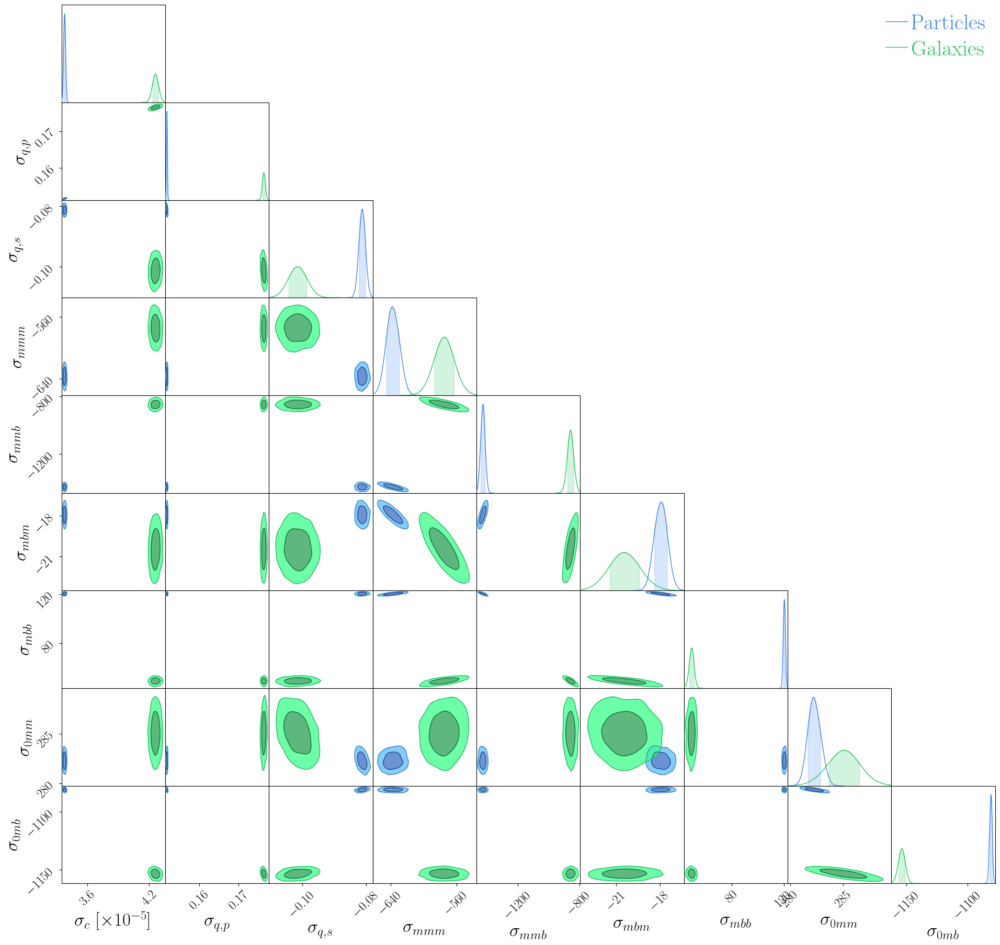

In [103]:
from chainconsumer import ChainConsumer, Chain, PlotConfig, Truth, ChainConfig
import pandas as pd


#Add galaxy chain

path = '/spiff/cosweeney/simulations/MDPL2/data/chains/'

file = h5.File( path + 'tangential_dist_simult_r_M_mcmc_4_30_MLE_long_allbins.h5', "r" )
samples = file['chain']
nsteps, nwalkers, ndim = samples.shape 

flat_samples = samples[1200::1, :, :].reshape((-1, samples.shape[-1]))

c = ChainConsumer()


chain = Chain.from_emcee(sampler, labels, name="Particles", discard=200, thin=1)
consumer = c.add_chain(chain)


df = pd.DataFrame(flat_samples, columns=labels)
#df["$\sigma_{p, p} \;[10^{6}]$"] = df["$\sigma_{p, p} \;[10^{6}]$"] / 1e6
#df["$\sigma_{s, p} \;[10^{-4}]$"] = df["$\sigma_{s, p} \;[10^{-4}]$"] / 1e-4
#df["$\sigma_c \;[10^{-5}]$"] = df["$\sigma_c \;[10^{-5}]$"] / 1e-5

c.add_chain(
    Chain(samples=df,
            name="Galaxies", 
            color='green'
               )
)

c.set_plot_config(PlotConfig(serif=True, 
                             usetex=True, 
                             max_ticks=2, 
                             tick_font_size=18,
                             label_font_size=25,
                             summary_font_size=12,
                             legend_kwargs={'fontsize':30}), 
                             )

c.set_override(ChainConfig(smooth=3, bins=10))

# Make the corner-style plot
fig = c.plotter.plot()

## Fit Joint Model

In [15]:
import scipy

path = '/spiff/cosweeney/simulations/MDPL2/data/chains/'

file = h5.File( path + 'joint_dist_simult_r_M_mcmc_long_4_30_MLE_allbins_final.h5', "r" )
samples = file['chain']
nsteps, nwalkers, ndim = samples.shape 

flat_samples = samples[1000::1, :, :].reshape((-1, samples.shape[-1]))

g_BF = np.mean(flat_samples, axis=0) 

In [49]:
# models, llh
soln = np.array([ 1.91954387e+02,  5.60350696e-01,  7.77202853e-01, -7.70422695e-02, 1.99712126e+05, -1.00841280e+00,  1.44993275e+00, -2.81948387e-01, -3.56045630e-02,  1.15721393e-01])
joint_init = np.array([ 1.89151774e+02,  5.84496355e-01,  7.47065625e-01, -1.24031446e-02, 1.99586056e+05, -9.80806163e-01,  1.44991418e+00, -2.62201773e-01, -3.53775390e-02,  1.15636618e-01 , 
                       3.38325620e-05,  1.51796936e-01, -8.14467317e-02, -6.37702540e+02, -1.42702202e+03, -1.78808347e+01,  1.20197420e+02,  2.82336335e+02, -1.08119638e+03])

def power_law(x, p, s):
    return p * x ** s

def joint_dist(vr, vt, r, M, pars):
    """The smooth model for the joint distribution
    P(v_r, v_t | r, M). 

    This is the product of the marginal 
    radial velocity distribution and the 
    conditional tangential velocity 
    distribution:
    
    P(v_r, v_t | r, M) = P(v_r | r, M)P(v_t | v_r, r, M)  

    Args:
        v_r (np.ndarray): radial velocity bin centers. 
        v_t (np.ndarray): tangential velocity bin centers.
        r (float): radial distance bin center.
        pars (np.ndarray): parameters defining radial dependence.
    """

    vrpp, vrps, vrsp, vrss, srpp, srps, srsp, srss, delta_m, delta_b, \
        s_c, s_qm, s_qb, s_mmm, s_mmb, s_mbm, s_mbb, s_0mm, s_0mb = pars


    marg_rad = radial_distribution_vec(vr, r, M, [vrpp, vrps, vrsp, vrss, srpp, srps, srsp, srss, delta_m, delta_b] ) 

    con_tan = conditional_tangential_dist_vec(vt, vr, r, M, [s_c, s_qm, s_qb, s_mmm, s_mmb, s_mbm, s_mbb, s_0mm, s_0mb] )

    jd = marg_rad * con_tan

    norm = np.sum(np.sum(jd*np.diff(vr)[0], axis=0)*np.diff(vt)[0], axis=0) 

    return jd / norm

def Pllh(pars):
    N = np.sum(np.sum(JH_p[:, :, :, 2:], axis=0), axis=0)[np.newaxis, np.newaxis, :] #Num of gals in distribution in r+M
    P = joint_dist(vcens, vcens, r_cens[2:], Mvirs, pars).transpose([1, 0, 2, 3]) 
    n = JH_p[:, :, :, 2:] # Num of gals in vel bin

    lam = P*dv*N 
    log_likelihood = np.sum(scipy.stats.poisson.logpmf(k=n, mu=lam)) 
    
    return log_likelihood 


def inform_log_prior(pars):
    vpp, vps, vsp, vss, spp, sps, ssp, sss, ddm, ddb, \
        sig_c, sig_qm, sig_qb, sig_mmm, sig_mmb, sig_mbm, sig_mbb, sig_0mm, sig_0mb = pars  
    
    w = 0.10 
    if (soln[0]*(1-w/2) < vpp < soln[0]*(1+w/2) and soln[1]*(1-w/2) < vps < soln[1]*(1+w/2) and soln[2]*(1-w/2) < vsp < soln[2]*(1+w/2) and -1 < vss < 1 and soln[4]*(1-w/2) < spp < soln[4]*(1+w/2) and soln[5]*(1+w/2) < sps < soln[5]*(1-w/2) and soln[6]*(1-w/2) < ssp < soln[6]*(1+w/2) and soln[7]*(1+w) < sss < soln[7]*(1-w) and soln[8]*(1+w/2) < ddm < 0.0 and soln[9]*(1-w/2) < ddb < soln[9]*(1+w/2) and
       0.0 <= sig_c <= 1e-4 and 0 <= sig_qm <= 1e2 and -10 <= sig_qb <= 0 and -1500 <= sig_mmm <= -200 and -5_000 <= sig_mmb <= 0 and -1000 <= sig_mbm <= 100 and 0 <= sig_mbb <= 1_000 and 0 <= sig_0mm <= 1_000 and -5_000 <= sig_0mb <= 0) : #and 0 <= sig_0bm <= 70_000 and 0 <= sig_0bb <= 300_000
        return 0.0
    return -np.inf 

def gal_inform_log_prior(pars):
    vpp, vps, vsp, vss, spp, sps, ssp, sss, ddm, ddb, \
        sig_c, sig_qm, sig_qb, sig_mmm, sig_mmb, sig_mbm, sig_mbb, sig_0mm, sig_0mb = pars  
    
    w = 0.20 
    if (g_BF[0]*(1-w/2) < vpp < g_BF[0]*(1+w/2) and g_BF[1]*(1-w/2) < vps < g_BF[1]*(1+w/2) and g_BF[2]*(1-w/2) < vsp < g_BF[2]*(1+w/2) and -1 < vss < 1 and g_BF[4]*(1-w/2) < spp < g_BF[4]*(1+w/2) and g_BF[5]*(1+w/2) < sps < g_BF[5]*(1-w/2) and g_BF[6]*(1-w/2) < ssp < g_BF[6]*(1+w/2) and g_BF[7]*(1+w) < sss < g_BF[7]*(1-w) and g_BF[8]*(1+w/2) < ddm < 0.0 and g_BF[9]*(1-w/2) < ddb < g_BF[9]*(1+w/2) and
       0.0 <= sig_c <= 1e-4 and 0 <= sig_qm <= 1e2 and -10 <= sig_qb <= 0 and -1500 <= sig_mmm <= -200 and -5_000 <= sig_mmb <= 0 and -1000 <= sig_mbm <= 100 and 0 <= sig_mbb <= 1_000 and 0 <= sig_0mm <= 1_000 and -5_000 <= sig_0mb <= 0) : #and 0 <= sig_0bm <= 70_000 and 0 <= sig_0bb <= 300_000
        return 0.0
    return -np.inf 

def ln_prior_restrict(pars):
    vpp, vps, vsp, vss, spp, sps, ssp, sss, ddm, ddb, sig_c, sig_qm, sig_qb, sig_mmm, sig_mmb, sig_mbm, sig_mbb, sig_0mm, sig_0mb = pars

    if (0 < vpp < 300 and 0.4 < vps < 1.0 and 0.4 < vsp < 1.0 and -0.1 < vss < 0.1 and 1e5 < spp < 6e6 and -1.2 < sps < -0.9 and 0 < ssp < 2.0 and -0.5 < sss < -0.355 and -1.0 < ddm < 0.0 and 0.0 < ddb < 1.0 and
        0.0 <= sig_c <= 1e-4 and 0 <= sig_qm <= 1e2 and -10 <= sig_qb <= 0 and -1500 <= sig_mmm <= -200 and -5_000 <= sig_mmb <= 0 and -1000 <= sig_mbm <= 100 and 0 <= sig_mbb <= 1_000 and 0 <= sig_0mm <= 1_000 and -5_000 <= sig_0mb <= 0 ): #and 0 <= sig_0bm <= 70_000 and 0 <= sig_0bb <= 300_000
        return 0.0
    return -np.inf 

def lprob(pars):
    lp = inform_log_prior(pars)
    if not np.isfinite(lp):
        return -np.inf
    return lp + Pllh(pars)

def gal_lprob(pars):
    lp = gal_inform_log_prior(pars)
    if not np.isfinite(lp):
        return -np.inf
    return lp + Pllh(pars)

lprob(joint_init) 

np.float64(-828404108.8801708)

In [45]:
print(gal_lprob(g_BF), Pllh(joint_init))

-828796729.4644152 -828404108.8801708


In [ ]:
# MLE 
res = scipy.optimize.minimize(lambda p: -lprob(p), joint_init, method='nelder-mead')
 

In [72]:
print("Initial: ", joint_init) 
print("MLE: ", res.x)

Initial:  [ 1.89151774e+02  5.84496355e-01  7.47065625e-01 -1.24031446e-02
  1.99586056e+05 -9.80806163e-01  1.44991418e+00 -2.62201773e-01
 -3.53775390e-02  1.15636618e-01  3.38325620e-05  1.51796936e-01
 -8.14467317e-02 -6.37702540e+02 -1.42702202e+03 -1.78808347e+01
  1.20197420e+02  2.82336335e+02 -1.08119638e+03]
MLE:  [ 1.89274827e+02  5.83981117e-01  7.47863822e-01 -1.33316764e-02
  1.99611683e+05 -9.80959118e-01  1.45001450e+00 -2.62303590e-01
 -3.54686051e-02  1.14008827e-01  3.20841835e-05  1.50276564e-01
 -8.29957439e-02 -6.42615329e+02 -1.41167223e+03 -1.79471080e+01
  1.19204199e+02  2.82882901e+02 -1.07836598e+03]


In [81]:
# MCMC

import emcee 
from multiprocessing import Pool

pos = res.x*(1 + 1e-3 * np.random.randn(40, res.x.shape[0])) 
nwalkers, ndim = pos.shape

with Pool() as pool:
    sampler = emcee.EnsembleSampler(
        nwalkers, ndim, lprob, pool=pool, #moves=[(emcee.moves.DEMove(), 0.8),(emcee.moves.DESnookerMove(), 0.2),],
    )

    sampler.run_mcmc(pos, 1_000, progress=True); 

print("Mean acceptance fraction: ", np.mean(sampler.acceptance_fraction)) 


100%|██████████| 1000/1000 [07:59<00:00,  2.08it/s]

Mean acceptance fraction:  0.31484999999999996


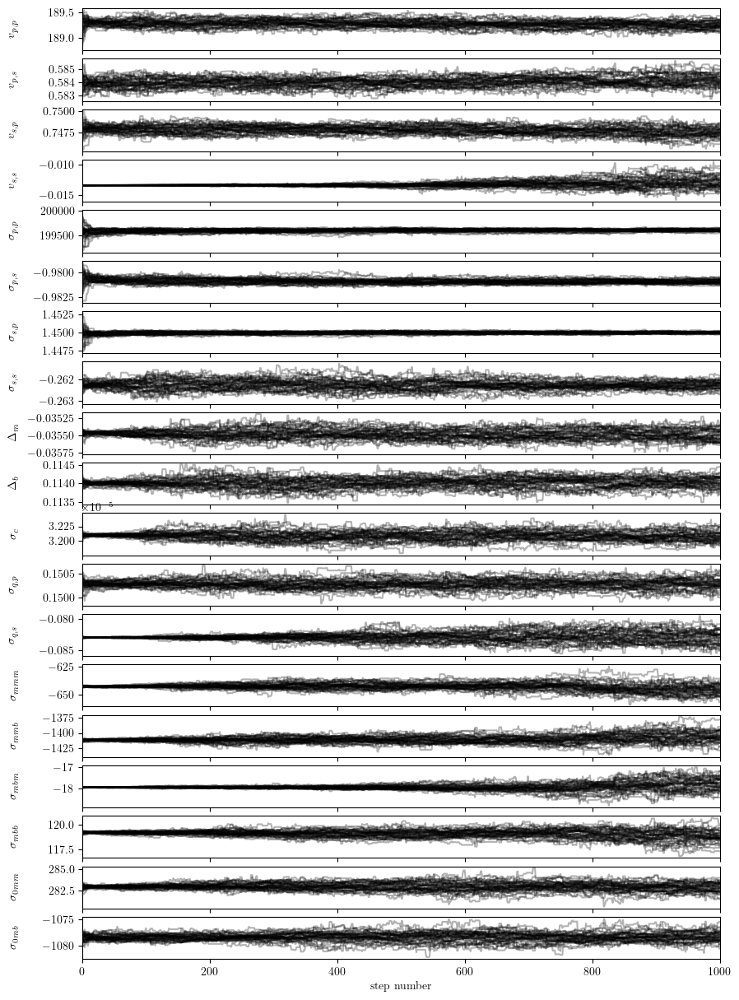

In [82]:
fig, axes = plt.subplots(ndim, figsize=(10, 15), sharex=True)
samples = sampler.get_chain()
labels = [r'$v_{p, p}$', r'$v_{p, s}$', r'$v_{s, p}$', r'$v_{s, s}$', r'$\sigma_{p, p}$', r'$\sigma_{p, s}$', r'$\sigma_{s, p}$', r'$\sigma_{s, s}$', r'$\Delta_m$', r'$\Delta_b$', 
          r"$\sigma_c$", r"$\sigma_{q, p}$", r"$\sigma_{q, s}$", r"$\sigma_{mmm}$", r"$\sigma_{mmb}$", r"$\sigma_{mbm}$", r"$\sigma_{mbb}$", r"$\sigma_{0mm}$", r"$\sigma_{0mb}$"]

for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5) 

axes[-1].set_xlabel("step number"); 


In [ ]:
import os

path = '/spiff/cosweeney/simulations/MDPL2/data/chains/'
filename = 'joint_dist_simult_r_M_mcmc_long_4_30_MLE_allbins_final.h5'
full_path = os.path.join(path, filename)

f = h5.File(full_path, 'r')
print(f.keys())
samples = f['chain']
nwalkers = samples.shape[1]
n_steps = samples.shape[0]
ndim = samples.shape[-1]

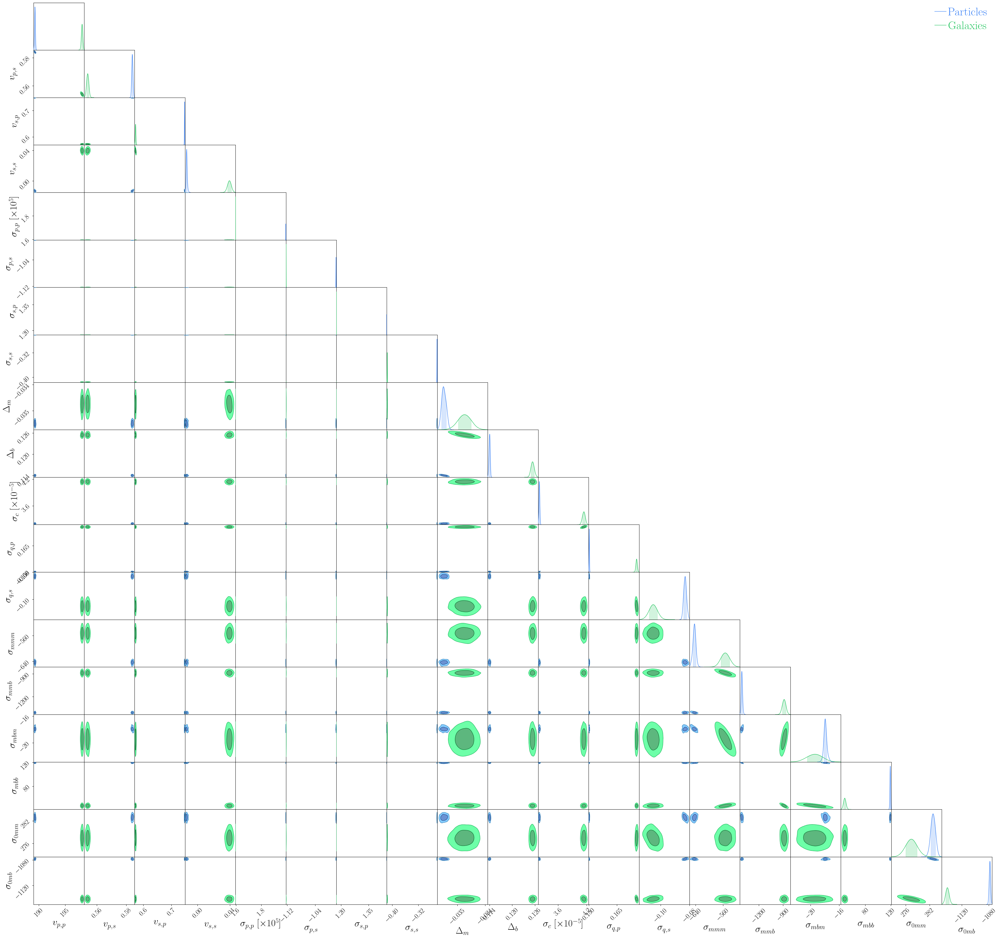

In [85]:
from chainconsumer import ChainConsumer, Chain, PlotConfig, Truth, ChainConfig
import pandas as pd


c = ChainConsumer()


chain = Chain.from_emcee(sampler, labels, name="Particles", discard=400, thin=1)
consumer = c.add_chain(chain)

#Add galaxy chain

path = '/spiff/cosweeney/simulations/MDPL2/data/chains/'

file = h5.File( path + 'joint_dist_simult_r_M_mcmc_long_4_30_MLE_allbins_final.h5', "r" )
samples = file['chain']
nsteps, nwalkers, ndim = samples.shape 

flat_samples = samples[1000::1, :, :].reshape((-1, samples.shape[-1]))

df = pd.DataFrame(flat_samples, columns=labels)


c.add_chain(Chain(samples=df,
            name="Galaxies", 
            color='green'
            ))

c.set_plot_config(PlotConfig(serif=True, 
                             usetex=True, 
                             max_ticks=2, 
                             tick_font_size=18,
                             label_font_size=25,
                             summary_font_size=12,
                             legend_kwargs={'fontsize':30}), 
                             )

c.set_override(ChainConfig(smooth=3, bins=10))

# Make the corner-style plot
fig = c.plotter.plot()

In [88]:
print('Gal BF: ', np.mean(flat_samples, axis=0) )
gal_BF = np.mean(flat_samples, axis=0)

Gal BF:  [ 1.98245740e+02  5.53864254e-01  5.72599825e-01  3.94979074e-02
  1.59549553e+05 -1.12290596e+00  1.17453007e+00 -4.15202148e-01
 -3.47438283e-02  1.25418100e-01  4.14120807e-05  1.75603722e-01
 -1.05050782e-01 -5.53160439e+02 -8.88075266e+02 -1.94336276e+01
  4.77148216e+01  2.77451118e+02 -1.14129223e+03]


In [86]:
# save sampler 

path = '/spiff/cosweeney/simulations/MDPL2/data/chains/'

import pickle

with open(path+"joint_simult_M_r6.5_particles.pkl", "wb") as f:
    pickle.dump(sampler, f)

In [34]:
# load sampler 

path = '/spiff/cosweeney/simulations/MDPL2/data/chains/'

import pickle

with open(path+"joint_simult_M_r6.5_particles.pkl", "rb") as f:
    cal_sampler = pickle.load(f)

In [50]:
# start from galaxy best fit

import emcee 
from multiprocessing import Pool

pos =  g_BF*(1 + 1e-3 * np.random.randn(40, g_BF.shape[0])) 
nwalkers, ndim = pos.shape

with Pool() as pool:
    sampler = emcee.EnsembleSampler(
        nwalkers, ndim, gal_lprob, pool=pool, #moves=[(emcee.moves.DEMove(), 0.8),(emcee.moves.DESnookerMove(), 0.2),],
    )

    sampler.run_mcmc(pos, 1_500, progress=True); 

print("Mean acceptance fraction: ", np.mean(sampler.acceptance_fraction)) 


100%|██████████| 1500/1500 [10:00<00:00,  2.50it/s]

Mean acceptance fraction:  0.21383333333333332


In [94]:
# save sampler 

path = '/spiff/cosweeney/simulations/MDPL2/data/chains/'

import pickle

with open(path+"joint_simult_M_r6.5_particles_init_at_galaxy_BF.pkl", "wb") as f:
    pickle.dump(sampler, f)

In [19]:
# load sampler 

path = '/spiff/cosweeney/simulations/MDPL2/data/chains/'

import pickle

with open(path+"joint_simult_M_r6.5_particles_init_at_galaxy_BF.pkl", "rb") as f:
    sampler = pickle.load(f)

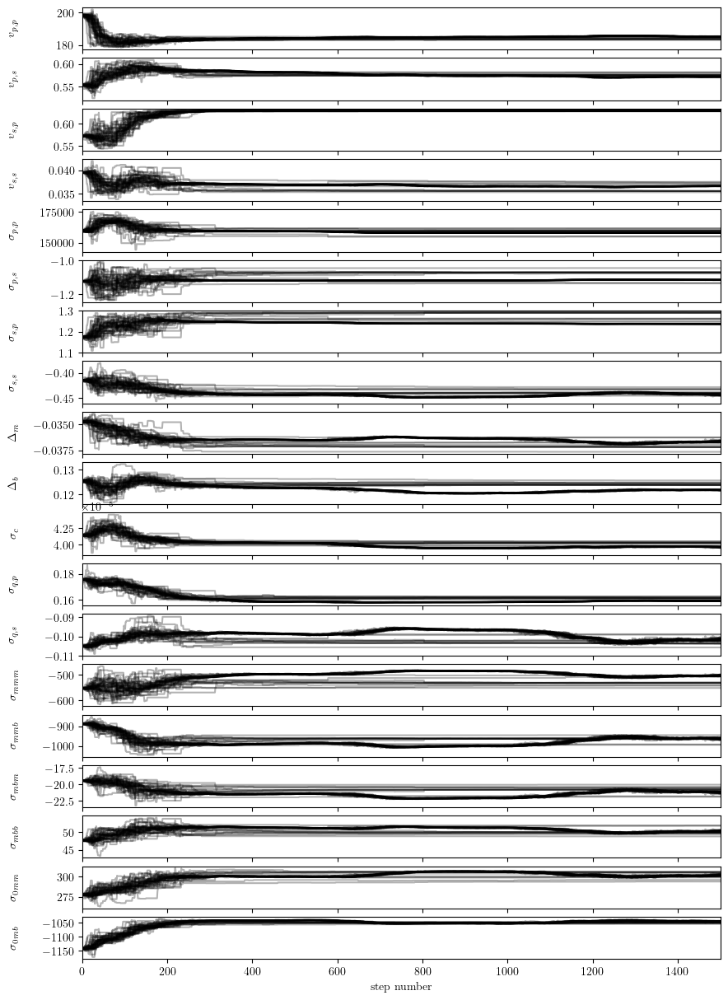

In [51]:
fig, axes = plt.subplots(ndim, figsize=(10, 15), sharex=True)
samples = sampler.get_chain()
labels = [r'$v_{p, p}$', r'$v_{p, s}$', r'$v_{s, p}$', r'$v_{s, s}$', r'$\sigma_{p, p}$', r'$\sigma_{p, s}$', r'$\sigma_{s, p}$', r'$\sigma_{s, s}$', r'$\Delta_m$', r'$\Delta_b$', 
          r"$\sigma_c$", r"$\sigma_{q, p}$", r"$\sigma_{q, s}$", r"$\sigma_{mmm}$", r"$\sigma_{mmb}$", r"$\sigma_{mbm}$", r"$\sigma_{mbb}$", r"$\sigma_{0mm}$", r"$\sigma_{0mb}$"]

for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5) 

axes[-1].set_xlabel("step number"); 


Parameter $v_{s, s}$ in chain From Galaxy BF is not constrained
Parameter $\sigma_{p, s}$ in chain From Galaxy BF is not constrained
Parameter $\sigma_{s, s}$ in chain From Galaxy BF is not constrained
Parameter $\Delta_b$ in chain From Galaxy BF is not constrained
Parameter $\sigma_{mmm}$ in chain From Galaxy BF is not constrained
Parameter $\sigma_{mbb}$ in chain From Galaxy BF is not constrained
Parameter $\sigma_{0mm}$ in chain From Galaxy BF is not constrained


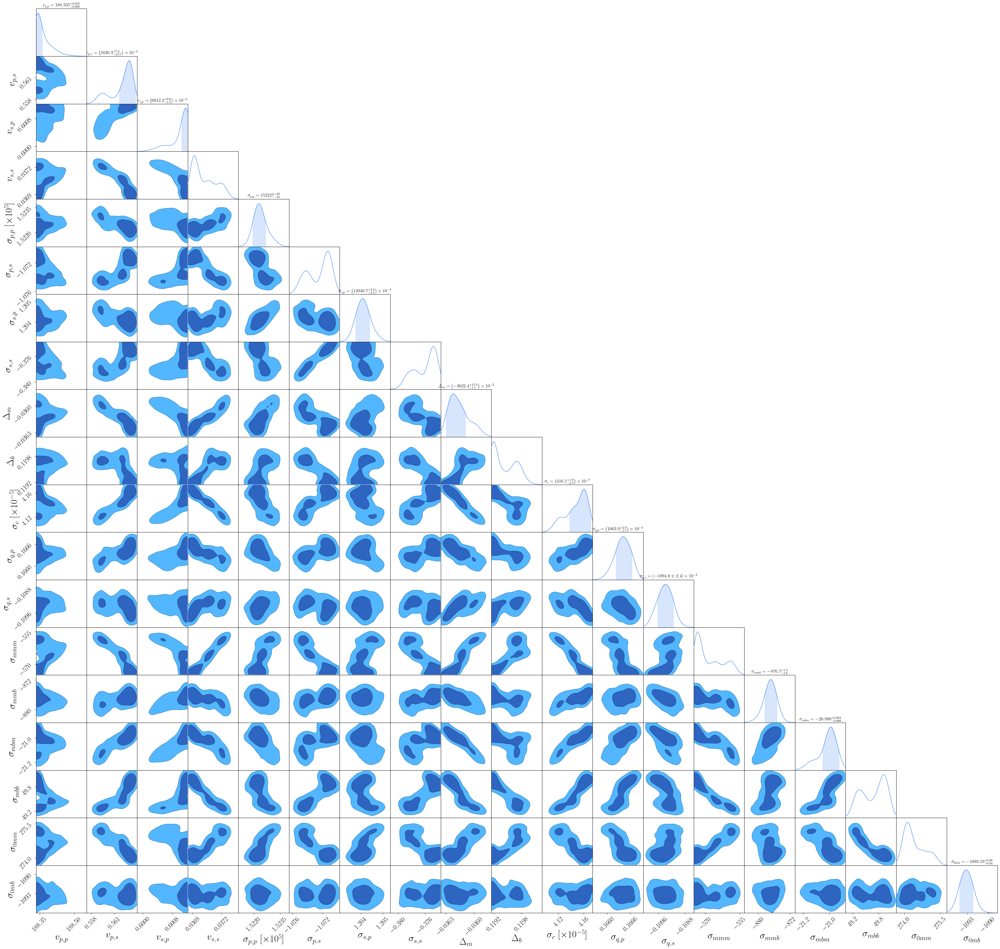

In [48]:
from chainconsumer import ChainConsumer, Chain, PlotConfig, Truth, ChainConfig
import pandas as pd


c = ChainConsumer()


chain = Chain.from_emcee(sampler, labels, name="From Galaxy BF", discard=1500, thin=1)
consumer = c.add_chain(chain)


# chain = Chain.from_emcee(cal_sampler, labels, name="Calibrated", discard=400, thin=1)
# consumer = c.add_chain(chain)

#Add galaxy chain

# path = '/spiff/cosweeney/simulations/MDPL2/data/chains/'

# file = h5.File( path + 'joint_dist_simult_r_M_mcmc_long_4_30_MLE_allbins_final.h5', "r" )
# samples = file['chain']
# nsteps, nwalkers, ndim = samples.shape 

# flat_samples = samples[1000::1, :, :].reshape((-1, samples.shape[-1]))

# df = pd.DataFrame(flat_samples, columns=labels)


# c.add_chain(Chain(samples=df,
#             name="Galaxies", 
#             color='green'
#             ))

c.set_plot_config(PlotConfig(serif=True, 
                             usetex=True, 
                             max_ticks=2, 
                             tick_font_size=18,
                             label_font_size=25,
                             summary_font_size=12,
                             legend_kwargs={'fontsize':30}), 
                             )

c.set_override(ChainConfig(smooth=3, bins=10))

# Make the corner-style plot
fig = c.plotter.plot() 
